# Capstone- Project on Banking

Business Problem:

A group of customers were given an offer in person that they can get a loan at discounted rate and processing fee will be waived off. A pilot campaign was conducted to get response from customers whether they are interested in taking out a loan or not. Response was recorded and data was collected. Based on data given we need to

1. Build a model to predict whether customers will be interested in taking out a loan or not.
2. Identifying features which are most important
3. In case of black box models e.g. Random forest use SHAP, LIME to figure out features affecting the target variable
4. Approaching a customer has costs involved with it, hence find the profitable segments so that more customized marketing can be done.
5. Model will be needed on a monthly basis as this data gets updated each month.

Variables involved: 
1. Age 
2. Gender - M, F, O
3. Balance- Monthly balance in the particular account
4. Occupation- SELF-EMP (self employed), SAL (salaried), SENP (small, medium amd large scale business), PROF (professionals)
5. No of Credit transaction
6. SCR 
7. Holding period
8. Target (0:not interested, 1: interested)

Work done so far:

1. Data Cleaning
2. Data visualization
3. Decision Tree
4. Logistic Regression
5. Identification of profitable segment
6. Random Forest
7. Important features by comparing the output of DT, logistic regression and random forest
8. LIME
9. SHAP
10. Permutation Feature Importance
11. KNN 
12. SVM 
13. CatBoost

Need to do:
1. To develop such model which can be updated on monthly basis



In [61]:
# importing important libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline   # To do the visualization in Python
import sklearn.ensemble
import sklearn.metrics
import _future_
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score
from imblearn.under_sampling import NearMiss
#from __future__ import print_function

UsageError: unrecognized arguments: # To do the visualization in Python


In [62]:
os.chdir("C:\\Users\\hp\\Downloads\\Download\\PERSONAL\\IIM Indore IPBA\\Class\\Project")

In [63]:
# Path of the file
path="C:\\Users\\hp\\Downloads\\Download\\PERSONAL\\IIM Indore IPBA\\Class\\Project\\Model_data.csv"

In [64]:
# Read the data into data frame
data=pd.read_csv(path)

In [65]:
# Check the first 5 records
data.head(5)

,Target,Age,Gender,Balance,Occupation,No_OF_CR_TXNS,SCR,Holding_Period
0,0,41,M,91519.92,SELF-EMP,38,926,15
1,0,52,M,117288.96,SAL,17,768,13
2,0,31,F,259827.44,SENP,8,816,5
3,0,45,F,26677.55,PROF,14,353,18
4,0,39,F,43440.31,SENP,1,751,31


## Exploratory Data Analysis (EDA)

In [7]:
data.shape

(20000, 8)

In [6]:
data.describe()

,Target,Age,Balance,No_OF_CR_TXNS,SCR,Holding_Period
count,20000.000000,20000.000000,2.000000e+04,20000.000000,20000.000000,20000.000000
mean,0.086650,38.396200,1.461813e+05,16.653050,557.136050,15.344100
std,0.281329,9.600179,1.698125e+05,12.977704,260.521453,8.952128
min,0.000000,21.000000,0.000000e+00,0.000000,100.000000,1.000000
25%,0.000000,30.000000,2.373692e+04,7.000000,333.000000,8.000000
50%,0.000000,38.000000,7.975574e+04,13.000000,560.000000,16.000000
75%,0.000000,47.000000,2.173106e+05,22.000000,784.000000,23.000000
max,1.000000,55.000000,1.246967e+06,50.000000,999.000000,31.000000


In [8]:
# Do we have missing values in the datframe 
data.isnull().sum()

Target            0
Age               0
Gender            0
Balance           0
Occupation        0
No_OF_CR_TXNS     0
SCR               0
Holding_Period    0
dtype: int64

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Target          20000 non-null  int64  
 1   Age             20000 non-null  int64  
 2   Gender          20000 non-null  object 
 3   Balance         20000 non-null  float64
 4   Occupation      20000 non-null  object 
 5   No_OF_CR_TXNS   20000 non-null  int64  
 6   SCR             20000 non-null  int64  
 7   Holding_Period  20000 non-null  int64  
dtypes: float64(1), int64(5), object(2)
memory usage: 1.2+ MB


There are no null values

In [10]:
# Check the data types
data.dtypes

Target              int64
Age                 int64
Gender             object
Balance           float64
Occupation         object
No_OF_CR_TXNS       int64
SCR                 int64
Holding_Period      int64
dtype: object

From data.info() and data.dtypes, Gender and Occupation are categorical varibles stored as object type

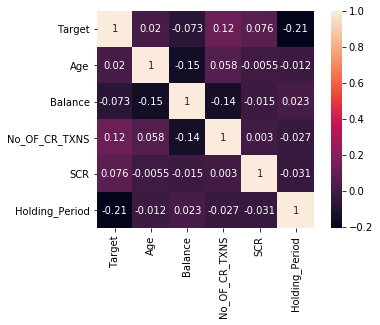

In [7]:
import seaborn as sns
sns.heatmap(data.corr(), annot=True, square=True) # No strong correlations seen overall
plt.show()

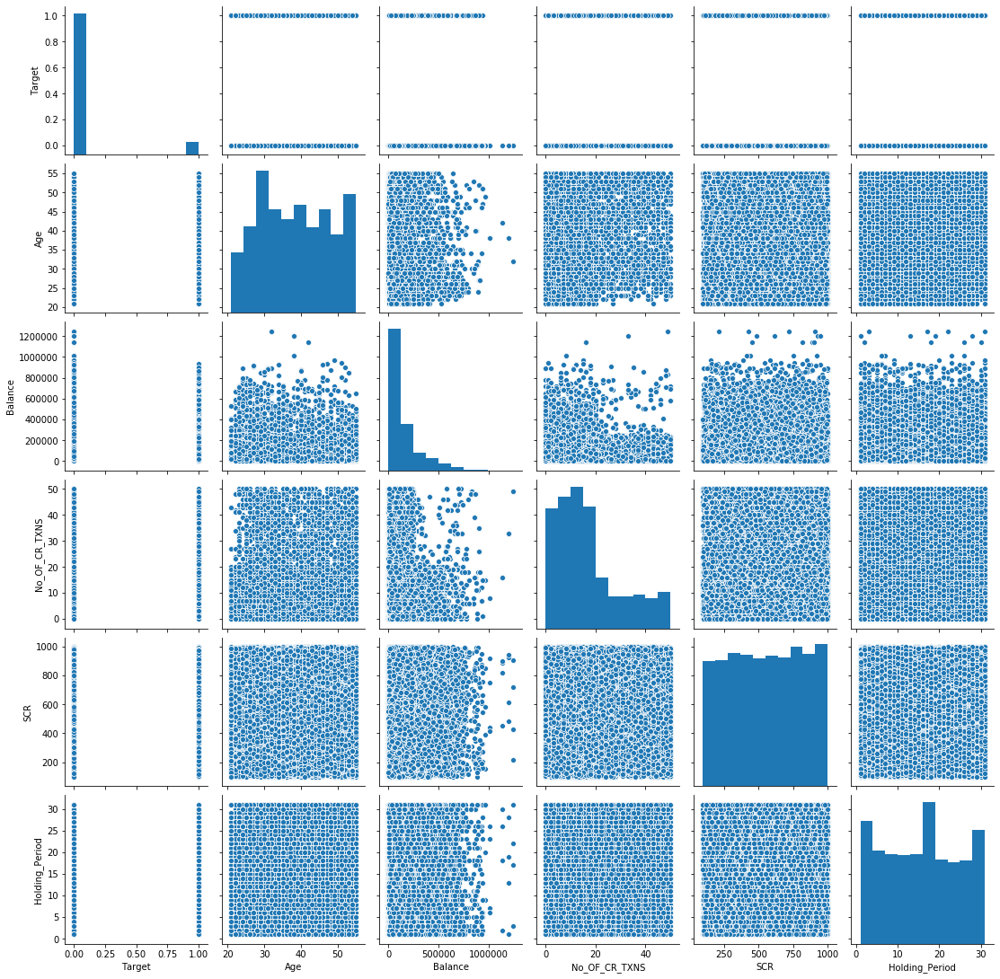

In [13]:
sns.pairplot(data) 
plt.show()

No Strong correlations. There exists a mild correlation between Holding_period and other variables

In [14]:
data.corr().style.background_gradient(cmap='viridis')

,Target,Age,Balance,No_OF_CR_TXNS,SCR,Holding_Period
Target,1.000000,0.019780,-0.072729,0.124565,0.076249,-0.206748
Age,0.019780,1.000000,-0.146920,0.058350,-0.005501,-0.011765
Balance,-0.072729,-0.146920,1.000000,-0.135032,-0.015087,0.022917
No_OF_CR_TXNS,0.124565,0.058350,-0.135032,1.000000,0.003036,-0.026593
SCR,0.076249,-0.005501,-0.015087,0.003036,1.000000,-0.030739
Holding_Period,-0.206748,-0.011765,0.022917,-0.026593,-0.030739,1.000000


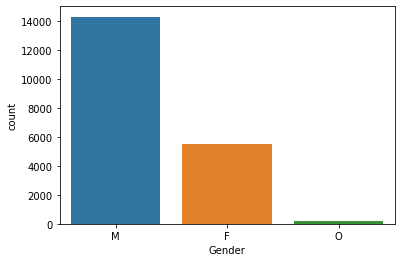

In [15]:
sns.countplot(x = data.Gender) #Graphs showing different parameters and count of gender
plt.show()

In [16]:
data.Gender.unique()

array(['M', 'F', 'O'], dtype=object)

In [17]:
data.Occupation.unique()

array(['SELF-EMP', 'SAL', 'SENP', 'PROF'], dtype=object)

In [18]:
data.Gender.value_counts()

M    14279
F     5525
O      196
Name: Gender, dtype: int64

In [7]:
data.Gender.value_counts()/data.shape[0]

M    0.71395
F    0.27625
O    0.00980
Name: Gender, dtype: float64

Gender as O signifies others. Through this, gender cannot be identified. Therefore, the rows with O as gender need to be dropped

#### Drop the rows with Gender=='O'

In [66]:
data.drop(data.Gender[data.Gender== 'O'].index, axis = 0, inplace= True) # Removed 196 rows with `Gender` = 'O'

In [67]:
data.shape

(19804, 8)

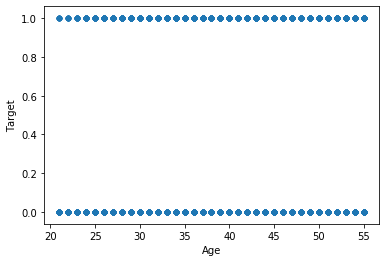

In [22]:
data.plot.scatter(x = 'Age', y = 'Target')

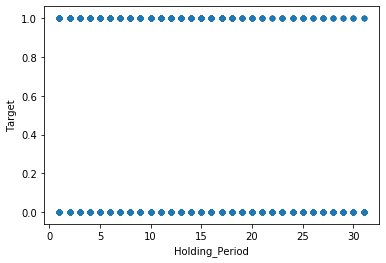

In [23]:
data.plot.scatter(x = 'Holding_Period', y = 'Target')

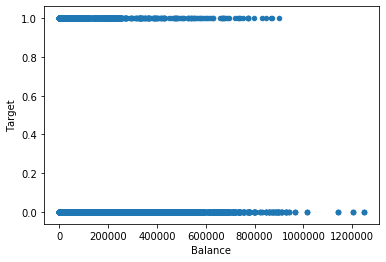

In [24]:
data.plot.scatter(x = 'Balance', y = 'Target')

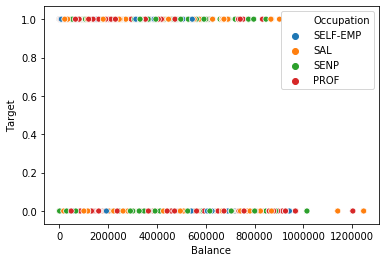

In [25]:
sns.scatterplot(data=data, x="Balance", y="Target", hue="Occupation")

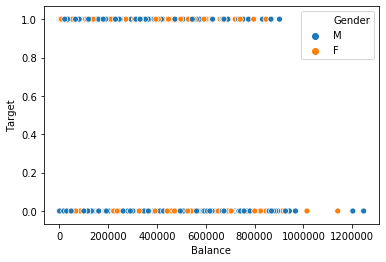

In [26]:
sns.scatterplot(data=data, x="Balance", y="Target", hue="Gender")

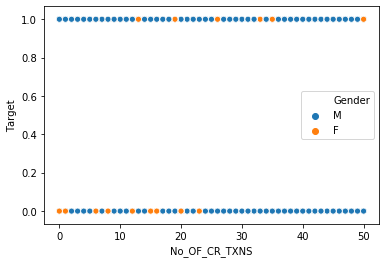

In [27]:
sns.scatterplot(data=data, x="No_OF_CR_TXNS", y="Target", hue="Gender")

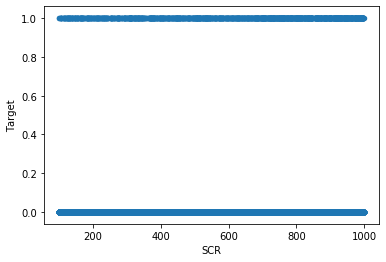

In [28]:
data.plot.scatter(x = 'SCR', y = 'Target')

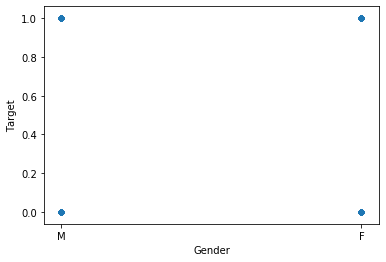

In [29]:
data.plot.scatter(x = 'Gender', y = 'Target') 

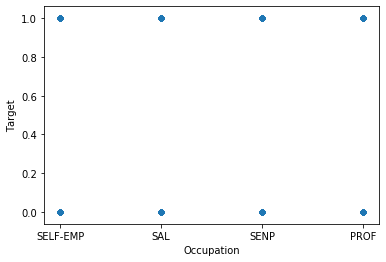

In [30]:
data.plot.scatter(x = 'Occupation', y = 'Target')

From the above scatter plots, it can be observed that there is an outlier in Balance. 
Balance between 11,00,000 to 13,00,000 are outliers.
So, these rows must be deleted

In [5]:
data[(data.Balance>1200000)].Balance.count()

8

#### Drop the customers with Balance>1200000 (for removing outliers)

In [68]:
data.drop(data.Balance[(data.Balance>1200000)].index, axis = 0, inplace= True) 

In [69]:
data.shape

(19796, 8)

In [36]:
#data.drop(data.Balance[(data.Balance<10)].index, axis = 0, inplace= True) 

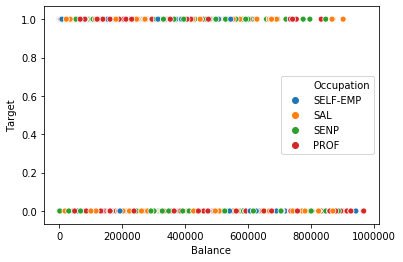

In [37]:
sns.scatterplot(data=data, x="Balance", y="Target", hue="Occupation")

In [38]:
data.Gender.value_counts()

M    14271
F     5517
Name: Gender, dtype: int64

In [39]:
data.Gender.value_counts()/data.shape[0] #Likely more males are having account 

M    0.721195
F    0.278805
Name: Gender, dtype: float64

In [40]:
print("Number of male interested: ", data[(data.Gender=='M') & (data.Target==1)].Target.sum()) #No. of male interested
print("Number of female interested: ", data[(data.Gender=='F') & (data.Target==1)].Target.sum()) #No. of female interested
print("Number of male not interested: ", data[(data.Gender=='M') & (data.Target==0)].Target.count()) #No. of male not interested
print("Number of female not interested: ", data[(data.Gender=='F') & (data.Target==0)].Target.count()) #No. of female not interested

Number of male interested:  1296
Number of female interested:  413
Number of male not interested:  12975
Number of female not interested:  5104


In [41]:
print ("Percentage of male interested: ",data[(data.Gender=='M') & (data.Target==1)].Target.sum()\
/data[(data.Gender=='M') ].Gender.count())
print ("Percentage of female interested: ",data[(data.Gender=='F') & (data.Target==1)].Target.sum()\
/data[(data.Gender=='F') ].Gender.count())
print ("Percentage of male not interested: ",data[(data.Gender=='M') & (data.Target==0)].Target.count()\
/data[(data.Gender=='M') ].Gender.count())
print ("Percentage of female not interested: ",data[(data.Gender=='F') & (data.Target==0)].Target.count()\
/data[(data.Gender=='F') ].Gender.count())


Percentage of male interested:  0.09081353794408241
Percentage of female interested:  0.0748595251042233
Percentage of male not interested:  0.9091864620559176
Percentage of female not interested:  0.9251404748957767


Only 9% of male population are interested. 90.9% of male population are not interested.

Only 7% of female population are interested. 92.5% of female population are not interested.

C:\Users\hp\anaconda3\lib\site-packages\seaborn\axisgrid.py:728: UserWarning: Using the countplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


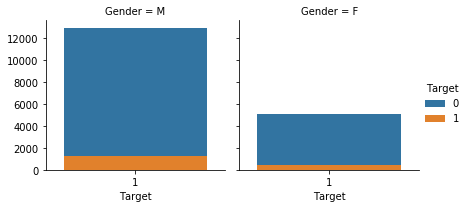

In [42]:
t = sns.FacetGrid(data, col='Gender', hue="Target")
plt.grid(True)
t.map(sns.countplot, "Target", alpha=1)
t.add_legend()
plt.grid((False))

In [43]:
data.Occupation.value_counts()

SAL         5743
PROF        5383
SENP        5328
SELF-EMP    3334
Name: Occupation, dtype: int64

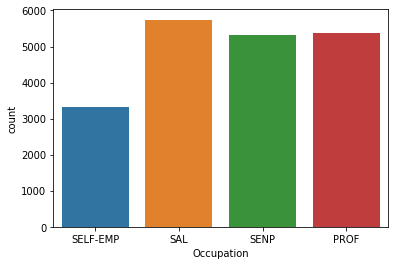

In [44]:
sns.countplot(x = data.Occupation)

In [45]:
print("Number of male Self employed: ", data[(data.Gender=='M') & (data.Occupation=='SELF-EMP')].Occupation.count()) 
print("Number of female Self employed: ", data[(data.Gender=='F') & (data.Occupation=='SELF-EMP')].Occupation.count()) 
print("Number of male Salaried: ", data[(data.Gender=='M') & (data.Occupation=='SAL')].Occupation.count()) 
print("Number of female Salaried: ", data[(data.Gender=='F') & (data.Occupation=='SAL')].Occupation.count())
print("Number of male Business owners: ", data[(data.Gender=='M') & (data.Occupation=='SENP')].Occupation.count()) 
print("Number of female Business owners: ", data[(data.Gender=='F') & (data.Occupation=='SENP')].Occupation.count()) 
print("Number of male Professionals: ", data[(data.Gender=='M') & (data.Occupation=='PROF')].Occupation.count()) 
print("Number of female Professionals: ", data[(data.Gender=='F') & (data.Occupation=='PROF')].Occupation.count())

Number of male Self employed:  2460
Number of female Self employed:  874
Number of male Salaried:  5087
Number of female Salaried:  656
Number of male Business owners:  2871
Number of female Business owners:  2457
Number of male Professionals:  3853
Number of female Professionals:  1530


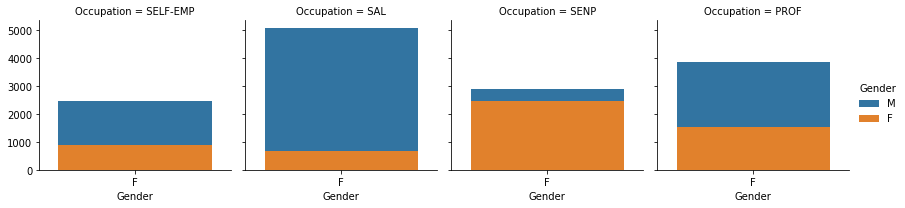

In [46]:
g = sns.FacetGrid(data, col='Occupation', hue="Gender")
plt.grid(True)
g.map(sns.countplot, "Gender", alpha=1)
g.add_legend()
plt.grid((False))

In [47]:
print("Number of Self employed interested: ", data[(data.Target==1) & (data.Occupation=='SELF-EMP')].Occupation.count()) 
print("Number of Self employed not interested: ", data[(data.Target==0) & (data.Occupation=='SELF-EMP')].Occupation.count()) 
print("Number of Salaried interested: ", data[(data.Target==1) & (data.Occupation=='SAL')].Occupation.count()) 
print("Number of Salaried not interested: ", data[(data.Target==0) & (data.Occupation=='SAL')].Occupation.count())
print("Number of Business owners interested: ", data[(data.Target==1) & (data.Occupation=='SENP')].Occupation.count()) 
print("Number of Business owners not interested: ", data[(data.Target==0) & (data.Occupation=='SENP')].Occupation.count()) 
print("Number of Professionals interested: ", data[(data.Target==1) & (data.Occupation=='PROF')].Occupation.count()) 
print("Number of Professionals not interested: ", data[(data.Target==0) & (data.Occupation=='PROF')].Occupation.count())

Number of Self employed interested:  502
Number of Self employed not interested:  2832
Number of Salaried interested:  405
Number of Salaried not interested:  5338
Number of Business owners interested:  377
Number of Business owners not interested:  4951
Number of Professionals interested:  425
Number of Professionals not interested:  4958


In [48]:
print("Percentage of Self employed interested: ", data[(data.Target==1) & (data.Occupation=='SELF-EMP')].Occupation.count()\
      /data[(data.Occupation=='SELF-EMP')].Occupation.count()) 
print("Percentage of Self employed not interested: ", data[(data.Target==0) & (data.Occupation=='SELF-EMP')].Occupation.count()\
     /data[(data.Occupation=='SELF-EMP')].Occupation.count()) 
print("Percentage of Salaried interested: ", data[(data.Target==1) & (data.Occupation=='SAL')].Occupation.count()\
      /data[(data.Occupation=='SAL')].Occupation.count()) 
print("Percentage of Salaried not interested: ", data[(data.Target==0) & (data.Occupation=='SAL')].Occupation.count()\
      /data[(data.Occupation=='SAL')].Occupation.count())
print("Percentage of Business owners interested: ", data[(data.Target==1) & (data.Occupation=='SENP')].Occupation.count()\
      /data[(data.Occupation=='SENP')].Occupation.count()) 
print("Percentage of Business owners not interested: ", data[(data.Target==0) & (data.Occupation=='SENP')].Occupation.count()\
     /data[(data.Occupation=='SENP')].Occupation.count()) 
print("Percentage of Professionals interested: ", data[(data.Target==1) & (data.Occupation=='PROF')].Occupation.count()\
     /data[(data.Occupation=='PROF')].Occupation.count()) 
print("Percentage of Professionals not interested: ", data[(data.Target==0) & (data.Occupation=='PROF')].Occupation.count()\
     /data[(data.Occupation=='PROF')].Occupation.count())

Percentage of Self employed interested:  0.15056988602279545
Percentage of Self employed not interested:  0.8494301139772046
Percentage of Salaried interested:  0.07052063381507923
Percentage of Salaried not interested:  0.9294793661849208
Percentage of Business owners interested:  0.07075825825825825
Percentage of Business owners not interested:  0.9292417417417418
Percentage of Professionals interested:  0.07895225710570314
Percentage of Professionals not interested:  0.9210477428942968


Among all the occupation, population having Occupation as SELF-EMP are 15% interested (comparatively larger than other Occupations)

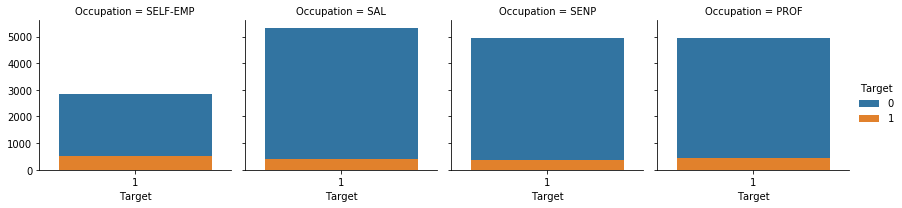

In [49]:
t1 = sns.FacetGrid(data, col='Occupation', hue="Target")
plt.grid(True)
t1.map(sns.countplot, "Target", alpha=1)
t1.add_legend()
plt.grid((False))

In [50]:
print("For Gender (M/F) and Self Employed \n")
print("Percentage of male and Self employed  are interested: \n", \
      data[(data.Target==1) & (data.Occupation=='SELF-EMP') & (data.Gender=='M')].Occupation.count()\
      /data[(data.Occupation=='SELF-EMP') & (data.Gender=='M')].Gender.count()) 

print("Percentage of male and Self employed  are not interested: \n ", \
      data[(data.Target==0) & (data.Occupation=='SELF-EMP') & (data.Gender=='M')].Occupation.count()\
      /data[(data.Occupation=='SELF-EMP') & (data.Gender=='M')].Gender.count()) 

print("Percentage of female and Self employed are interested: \n", \
      data[(data.Target==1) & (data.Occupation=='SELF-EMP') & (data.Gender=='F')].Occupation.count()\
     /data[(data.Occupation=='SELF-EMP') & (data.Gender=='F')].Gender.count()) 

print("Percentage of female and Self employed are not interested: \n", \
      data[(data.Target==0) & (data.Occupation=='SELF-EMP') & (data.Gender=='F')].Occupation.count()\
     /data[(data.Occupation=='SELF-EMP') & (data.Gender=='F')].Gender.count()) 

print("\nFor Gender(M/F) and Salaried \n")
print("Percentage of male and Salaried  are interested: \n", \
      data[(data.Target==1) & (data.Occupation=='SAL') & (data.Gender=='M')].Occupation.count()\
      /data[(data.Occupation=='SAL') & (data.Gender=='M')].Gender.count()) 

print("Percentage of male and Salaried  are not interested: \n ", \
      data[(data.Target==0) & (data.Occupation=='SAL') & (data.Gender=='M')].Occupation.count()\
      /data[(data.Occupation=='SAL') & (data.Gender=='M')].Gender.count()) 

print("Percentage of female and Salaried are interested: \n", \
      data[(data.Target==1) & (data.Occupation=='SAL') & (data.Gender=='F')].Occupation.count()\
     /data[(data.Occupation=='SAL') & (data.Gender=='F')].Gender.count()) 

print("Percentage of female and Salaried are not interested: \n", \
      data[(data.Target==0) & (data.Occupation=='SAL') & (data.Gender=='F')].Occupation.count()\
     /data[(data.Occupation=='SAL') & (data.Gender=='F')].Gender.count())

print("\nFor Gender(M/F) and Business Owners \n")
print("Percentage of male and Business Owners  are interested: \n", \
      data[(data.Target==1) & (data.Occupation=='SENP') & (data.Gender=='M')].Occupation.count()\
      /data[(data.Occupation=='SENP') & (data.Gender=='M')].Gender.count()) 

print("Percentage of male and Business Owners  are not interested: \n ", \
      data[(data.Target==0) & (data.Occupation=='SENP') & (data.Gender=='M')].Occupation.count()\
      /data[(data.Occupation=='SENP') & (data.Gender=='M')].Gender.count()) 

print("Percentage of female and Business Owners are interested: \n", \
      data[(data.Target==1) & (data.Occupation=='SENP') & (data.Gender=='F')].Occupation.count()\
     /data[(data.Occupation=='SENP') & (data.Gender=='F')].Gender.count()) 

print("Percentage of female and Business Owners are not interested: \n", \
      data[(data.Target==0) & (data.Occupation=='SENP') & (data.Gender=='F')].Occupation.count()\
     /data[(data.Occupation=='SENP') & (data.Gender=='F')].Gender.count())

print("\nFor Gender(M/F) and Professionals \n")
print("Percentage of male and Professionals  are interested: \n", \
      data[(data.Target==1) & (data.Occupation=='PROF') & (data.Gender=='M')].Occupation.count()\
      /data[(data.Occupation=='PROF') & (data.Gender=='M')].Gender.count()) 

print("Percentage of male and Professionals  are not interested: \n ", \
      data[(data.Target==0) & (data.Occupation=='PROF') & (data.Gender=='M')].Occupation.count()\
      /data[(data.Occupation=='PROF') & (data.Gender=='M')].Gender.count()) 

print("Percentage of female and Professionals are interested: \n", \
      data[(data.Target==1) & (data.Occupation=='PROF') & (data.Gender=='F')].Occupation.count()\
     /data[(data.Occupation=='PROF') & (data.Gender=='F')].Gender.count()) 

print("Percentage of female and Professionals are not interested: \n", \
      data[(data.Target==0) & (data.Occupation=='PROF') & (data.Gender=='F')].Occupation.count()\
     /data[(data.Occupation=='PROF') & (data.Gender=='F')].Gender.count())


For Gender (M/F) and Self Employed 

Percentage of male and Self employed  are interested: 
 0.16016260162601625
Percentage of male and Self employed  are not interested: 
  0.8398373983739837
Percentage of female and Self employed are interested: 
 0.12356979405034325
Percentage of female and Self employed are not interested: 
 0.8764302059496567

For Gender(M/F) and Salaried 

Percentage of male and Salaried  are interested: 
 0.06329860428543346
Percentage of male and Salaried  are not interested: 
  0.9367013957145666
Percentage of female and Salaried are interested: 
 0.12652439024390244
Percentage of female and Salaried are not interested: 
 0.8734756097560976

For Gender(M/F) and Business Owners 

Percentage of male and Business Owners  are interested: 
 0.0943921978404737
Percentage of male and Business Owners  are not interested: 
  0.9056078021595263
Percentage of female and Business Owners are interested: 
 0.04314204314204314
Percentage of female and Business Owners are not

Observations:
1. Males and females who are self employed are likely more interested
2. 12% of females who are salaried are interested
3. All other categories are less interested (less than 10%)
4. Most likely majority population are not interested

In [48]:
data.Age.describe()

count    19796.000000
mean        38.383916
std          9.599598
min         21.000000
25%         30.000000
50%         38.000000
75%         46.000000
max         55.000000
Name: Age, dtype: float64

Minimum age is 22. maximum age is 55. So, the age can be grouped into a bucket of five.

In [8]:
print("Account holders b/w age 20 to 25 : ",data[(data.Age>20) & (data.Age<=25)].Age.count())
print("Account holders b/w age 25 to 30 : ",data[(data.Age>25) & (data.Age<=30)].Age.count())
print("Account holders b/w age 30 to 35 : ",data[(data.Age>30) & (data.Age<=35)].Age.count())
print("Account holders b/w age 35 to 40 : ",data[(data.Age>35) & (data.Age<=40)].Age.count())
print("Account holders b/w age 40 to 45 : ",data[(data.Age>40) & (data.Age<=45)].Age.count())
print("Account holders b/w age 45 to 50 : ",data[(data.Age>45) & (data.Age<=50)].Age.count())
print("Account holders b/w age 50 to 55 : ",data[(data.Age>50) & (data.Age<=55)].Age.count())

Account holders b/w age 20 to 25 :  1784
Account holders b/w age 25 to 30 :  3404
Account holders b/w age 30 to 35 :  3484
Account holders b/w age 35 to 40 :  2752
Account holders b/w age 40 to 45 :  3016
Account holders b/w age 45 to 50 :  2532
Account holders b/w age 50 to 55 :  3020


In this sample dataset, age group of 30 to 35 years are holding most number of accounts.

In [50]:
print("Percentage of Interested Account holders b/w age 20 to 25 : \n",\
      data[(data.Age>20) & (data.Age<=25) & (data.Target==1)].Age.count()/data[(data.Age>20) & (data.Age<=25)].Age.count())
print("Percentage of not Interested Account holders b/w age 20 to 25 : \n",\
      data[(data.Age>20) & (data.Age<=25) & (data.Target==0)].Age.count()/data[(data.Age>20) & (data.Age<=25)].Age.count())
print("\nPercentage of Interested Account holders b/w age 25 to 30 : \n",\
      data[(data.Age>25) & (data.Age<=30) & (data.Target==1)].Age.count()/data[(data.Age>25) & (data.Age<=30)].Age.count())
print("Percentage of not Interested Account holders b/w age 25 to 30 : \n",\
      data[(data.Age>25) & (data.Age<=30) & (data.Target==0)].Age.count()/data[(data.Age>25) & (data.Age<=30)].Age.count())
print("\nPercentage of Interested Account holders b/w age 30 to 35 : \n",\
      data[(data.Age>30) & (data.Age<=35) & (data.Target==1)].Age.count()/data[(data.Age>30) & (data.Age<=35)].Age.count())
print("Percentage of not Interested Account holders b/w age 30 to 35 : \n",\
      data[(data.Age>30) & (data.Age<=35) & (data.Target==0)].Age.count()/data[(data.Age>30) & (data.Age<=35)].Age.count())
print("\nPercentage of Interested Account holders b/w age 35 to 40 : \n",\
      data[(data.Age>35) & (data.Age<=40) & (data.Target==1)].Age.count()/data[(data.Age>35) & (data.Age<=40)].Age.count())
print("Percentage of not Interested Account holders b/w age 35 to 40 : \n",\
      data[(data.Age>35) & (data.Age<=40) & (data.Target==0)].Age.count()/data[(data.Age>35) & (data.Age<=40)].Age.count())
print("\nPercentage of Interested Account holders b/w age 40 to 45 : \n",\
      data[(data.Age>40) & (data.Age<=45) & (data.Target==1)].Age.count()/data[(data.Age>40) & (data.Age<=45)].Age.count())
print("Percentage of not Interested Account holders b/w age 40 to 45 : \n",\
      data[(data.Age>40) & (data.Age<=45) & (data.Target==0)].Age.count()/data[(data.Age>40) & (data.Age<=45)].Age.count())
print("\nPercentage of Interested Account holders b/w age 45 to 50 : \n",\
      data[(data.Age>45) & (data.Age<=50) & (data.Target==1)].Age.count()/data[(data.Age>45) & (data.Age<=50)].Age.count())
print("Percentage of not Interested Account holders b/w age 45 to 50 : \n",\
      data[(data.Age>45) & (data.Age<=50) & (data.Target==0)].Age.count()/data[(data.Age>45) & (data.Age<=50)].Age.count())
print("\nPercentage of Interested Account holders b/w age 50 to 55 : \n",\
      data[(data.Age>50) & (data.Age<=55) & (data.Target==1)].Age.count()/data[(data.Age>50) & (data.Age<=55)].Age.count())
print("Percentage of not Interested Account holders b/w age 50 to 55 : \n",\
      data[(data.Age>50) & (data.Age<=55) & (data.Target==0)].Age.count()/data[(data.Age>50) & (data.Age<=55)].Age.count())


Percentage of Interested Account holders b/w age 20 to 25 : 
 0.06602708803611738
Percentage of not Interested Account holders b/w age 20 to 25 : 
 0.9339729119638827

Percentage of Interested Account holders b/w age 25 to 30 : 
 0.0758026159334126
Percentage of not Interested Account holders b/w age 25 to 30 : 
 0.9241973840665874

Percentage of Interested Account holders b/w age 30 to 35 : 
 0.07987312572087658
Percentage of not Interested Account holders b/w age 30 to 35 : 
 0.9201268742791234

Percentage of Interested Account holders b/w age 35 to 40 : 
 0.095900439238653
Percentage of not Interested Account holders b/w age 35 to 40 : 
 0.904099560761347

Percentage of Interested Account holders b/w age 40 to 45 : 
 0.11727150537634409
Percentage of not Interested Account holders b/w age 40 to 45 : 
 0.8827284946236559

Percentage of Interested Account holders b/w age 45 to 50 : 
 0.094
Percentage of not Interested Account holders b/w age 45 to 50 : 
 0.906

Percentage of Intereste

#### Bucket the customers' age and create a new variable as 'AgeGroup'

In [70]:
data.loc[((data['Age']>20) & (data['Age']<=25)), 'AgeGroup']="AgeRange_20to25"
data.loc[((data['Age']>25) & (data['Age']<=30)), 'AgeGroup']="AgeRange_25to30"
data.loc[((data['Age']>30) & (data['Age']<=35)), 'AgeGroup']="AgeRange_30to35"
data.loc[((data['Age']>35) & (data['Age']<=40)), 'AgeGroup']="AgeRange_35to40"
data.loc[((data['Age']>40) & (data['Age']<=45)), 'AgeGroup']="AgeRange_40to45"
data.loc[((data['Age']>45) & (data['Age']<=50)), 'AgeGroup']="AgeRange_45to50"
data.loc[((data['Age']>50) & (data['Age']<=55)), 'AgeGroup']="AgeRange_50to55"

In [71]:
data.head()

,Target,Age,Gender,Balance,Occupation,No_OF_CR_TXNS,SCR,Holding_Period,AgeGroup
0,0,41,M,91519.92,SELF-EMP,38,926,15,AgeRange_40to45
1,0,52,M,117288.96,SAL,17,768,13,AgeRange_50to55
2,0,31,F,259827.44,SENP,8,816,5,AgeRange_30to35
3,0,45,F,26677.55,PROF,14,353,18,AgeRange_40to45
4,0,39,F,43440.31,SENP,1,751,31,AgeRange_35to40


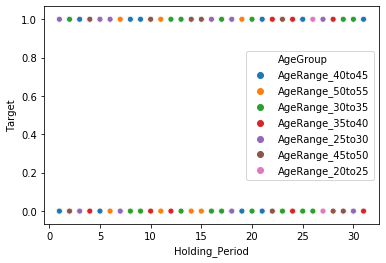

In [53]:
sns.scatterplot(data=data, x="Holding_Period", y="Target", hue="AgeGroup")

In [54]:
data.dtypes

Target              int64
Age                 int64
Gender             object
Balance           float64
Occupation         object
No_OF_CR_TXNS       int64
SCR                 int64
Holding_Period      int64
AgeGroup           object
dtype: object

C:\Users\hp\anaconda3\lib\site-packages\seaborn\axisgrid.py:728: UserWarning: Using the countplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


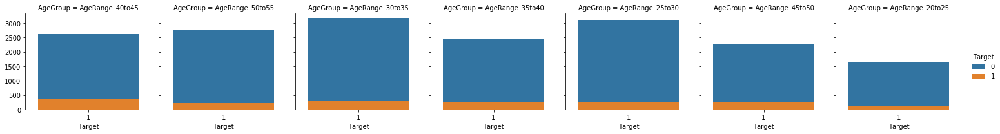

In [55]:
t3 = sns.FacetGrid(data, col='AgeGroup', hue="Target")
plt.grid(True)
t3.map(sns.countplot, "Target", alpha=1)
t3.add_legend()
plt.grid((False))

Account holders with AgeRange_40to45, AgeRange_35to40 and AgeRange_45to50 are more likely interested.
Among these three age groups, account holders with an age between 40 to 45 are majorly interested.
So, that age group can be targeted.

In [56]:
data.Balance.describe()

count    1.979600e+04
mean     1.461257e+05
std      1.680897e+05
min      0.000000e+00
25%      2.399973e+04
50%      8.033540e+04
75%      2.180436e+05
max      1.140804e+06
Name: Balance, dtype: float64

(0, 1000000.0)

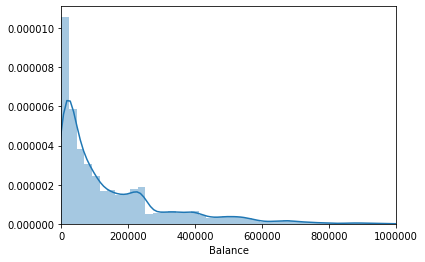

In [57]:
sns.distplot(data.Balance)
plt.xlim([0,1e6])

In [58]:
data.groupby('Occupation').agg({'Balance':'mean'}).sort_values(['Balance'],ascending=True)

,Balance
Occupation,
SAL,122775.705864
SELF-EMP,128516.897582
PROF,147266.636576
SENP,181151.588434


The business owners are likely having the most balance monthwise. At the same time, the balance of salaried group and the self employed group are close to each lower and at the lower side.

This links with the earlier observation that the salaried and self employed are likely more interested. It is due to their low balance or high expense.

In [59]:
data.groupby('AgeGroup').agg({'Balance':'mean'}).sort_values(['Balance'],ascending=True)

,Balance
AgeGroup,
AgeRange_40to45,119828.308280
AgeRange_45to50,124588.860128
AgeRange_50to55,127547.148619
AgeRange_35to40,132595.072167
AgeRange_30to35,147050.404521
AgeRange_25to30,171344.965470
AgeRange_20to25,223136.005214


Age Range between 40 to 45 are likely having least balance compared to other categories. 

So, with respect to earlier obsersevation, this group has likely highly interested. It may be due to the lower balance.

In [60]:
data.groupby(['Occupation','AgeGroup','Gender']).agg({'Balance':'mean'}).sort_values(['Balance'],ascending=True)

Balance
Occupation AgeGroup        Gender               
SELF-EMP   AgeRange_40to45 M        68300.063325
SAL        AgeRange_45to50 M        84265.883457
SELF-EMP   AgeRange_45to50 M        87435.411743
PROF       AgeRange_40to45 M        96074.822943
SAL        AgeRange_50to55 M        96726.342078
           AgeRange_40to45 M        96747.369803
SELF-EMP   AgeRange_50to55 M        98289.686043
SAL        AgeRange_35to40 M        99383.255495
           AgeRange_50to55 F       102817.141134
PROF       AgeRange_45to50 M       111730.979076
SELF-EMP   AgeRange_35to40 M       112603.709782
SAL        AgeRange_35to40 F       117175.536118
PROF       AgeRange_35to40 M       117390.273587
SELF-EMP   AgeRange_30to35 M       119758.061486
SAL        AgeRange_30to35 M       120476.449004
PROF       AgeRange_50to55 M       125164.994655
           AgeRange_30to35 M       129482.970967
SELF-EMP   AgeRange_35to40 F       130112.698609
           AgeRange_50to55 F       131185.470123
           AgeRange_25to30 M       134611.443944
           AgeRange_40to45 F       136489.111508
SENP       AgeRange_40to45 M       137871.350519
           AgeRange_30to35 M       142743.494720
           AgeRange_35to40 M       145753.832764
PROF       AgeRange_45to50 F       147623.939078
           AgeRange_25to30 M       150209.267717
SAL        AgeRange_25to30 M       154174.926032
SENP       AgeRange_45to50 M       155417.992975
PROF       AgeRange_35to40 F       156781.566421
SENP       AgeRange_50to55 M       158497.282460
SAL        AgeRange_20to25 F       160160.099811
SENP       AgeRange_50to55 F       168272.724120
           AgeRange_25to30 M       171314.291485
SAL        AgeRange_30to35 F       172565.623712
SENP       AgeRange_45to50 F       173002.210250
           AgeRange_40to45 F       174044.978069
SELF-EMP   AgeRange_20to25 M       176681.176386
           AgeRange_30to35 F       178932.476950
PROF       AgeRange_30to35 F       184718.737423
SENP       AgeRange_20to25 M       192191.809463
PROF       AgeRange_40to45 F       192936.230147
SAL        AgeRange_20to25 M       199799.764298
           AgeRange_40to45 F       204420.943274
PROF       AgeRange_50to55 F       205760.997833
           AgeRange_25to30 F       206141.870256
SENP       AgeRange_25to30 F       208075.790387
SELF-EMP   AgeRange_20to25 F       215574.922597
           AgeRange_45to50 F       221385.843636
SENP       AgeRange_35to40 F       222523.877831
SAL        AgeRange_25to30 F       224550.513103
PROF       AgeRange_20to25 M       226674.863032
SENP       AgeRange_30to35 F       227581.022353
SAL        AgeRange_45to50 F       235314.046250
SELF-EMP   AgeRange_25to30 F       241081.000000
SENP       AgeRange_20to25 F       269131.736751
PROF       AgeRange_20to25 F       272138.384645

Account holders with following details have likely the least balance:
    1. Self empolyed - Age group 40 to 45 - male
    2. Salaried- Age group 45 to 50 - male
    3. Self empolyed - Age group 45 to 50 - male
    Thus, this group are likely more interested.

(array([3278., 3576., 3869., 3327., 1363.,  851.,  849.,  888.,  814.,
         981.]),
 array([ 0.,  5., 10., 15., 20., 25., 30., 35., 40., 45., 50.]),
 <a list of 10 Patch objects>)

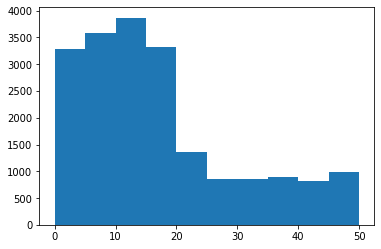

In [61]:
plt.hist(data.No_OF_CR_TXNS)

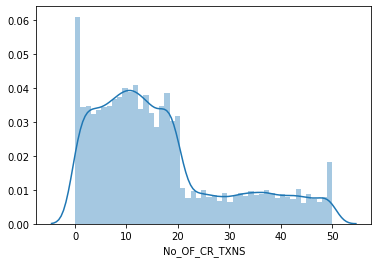

In [62]:
sns.distplot(data.No_OF_CR_TXNS)

In [63]:
data.No_OF_CR_TXNS.describe()

count    19796.000000
mean        16.553294
std         12.920486
min          0.000000
25%          7.000000
50%         13.000000
75%         21.000000
max         50.000000
Name: No_OF_CR_TXNS, dtype: float64

Minimum no. of credit transaction=0; Maximum no. of credit of transaction= 50; Mean= 16.5

In [64]:
data.groupby(['Occupation','AgeGroup','Gender']).agg({'No_OF_CR_TXNS':'mean'}).sort_values(['No_OF_CR_TXNS'],ascending=True)

No_OF_CR_TXNS
Occupation AgeGroup        Gender               
SELF-EMP   AgeRange_50to55 F            9.037037
SENP       AgeRange_45to50 F            9.333333
           AgeRange_20to25 F            9.773300
           AgeRange_25to30 F            9.784504
           AgeRange_30to35 F            9.838235
           AgeRange_40to45 F           10.037464
           AgeRange_35to40 F           10.216901
PROF       AgeRange_30to35 F           10.484615
SENP       AgeRange_50to55 F           10.498339
SAL        AgeRange_25to30 F           10.543103
PROF       AgeRange_20to25 F           10.879781
SENP       AgeRange_20to25 M           11.000000
           AgeRange_35to40 M           11.470085
SELF-EMP   AgeRange_25to30 F           11.523810
SENP       AgeRange_50to55 M           11.662870
PROF       AgeRange_35to40 F           12.142105
           AgeRange_50to55 F           12.295567
SELF-EMP   AgeRange_30to35 F           12.475177
           AgeRange_35to40 F           12.504348
           AgeRange_20to25 F           12.512987
PROF       AgeRange_25to30 F           12.794872
SENP       AgeRange_45to50 M           12.855524
SAL        AgeRange_40to45 F           13.159292
SELF-EMP   AgeRange_40to45 F           13.230159
PROF       AgeRange_45to50 F           13.543779
           AgeRange_40to45 F           13.573529
SENP       AgeRange_40to45 M           13.660377
           AgeRange_30to35 M           13.815735
           AgeRange_25to30 M           13.925734
SAL        AgeRange_20to25 F           14.094340
SELF-EMP   AgeRange_45to50 F           14.727273
SAL        AgeRange_30to35 F           15.621212
SELF-EMP   AgeRange_20to25 M           16.512048
           AgeRange_35to40 M           16.738420
PROF       AgeRange_25to30 M           17.074581
           AgeRange_45to50 M           17.105360
SELF-EMP   AgeRange_25to30 M           17.261972
PROF       AgeRange_35to40 M           17.309783
           AgeRange_30to35 M           17.372294
           AgeRange_50to55 M           17.708882
SELF-EMP   AgeRange_30to35 M           17.901606
PROF       AgeRange_20to25 M           18.027149
SELF-EMP   AgeRange_50to55 M           18.751534
SAL        AgeRange_20to25 M           19.811798
SELF-EMP   AgeRange_45to50 M           20.269113
SAL        AgeRange_35to40 F           20.411765
SELF-EMP   AgeRange_40to45 M           20.643705
SAL        AgeRange_45to50 F           21.375000
           AgeRange_35to40 M           21.430962
           AgeRange_40to45 M           21.560526
PROF       AgeRange_40to45 M           21.865749
SAL        AgeRange_50to55 M           21.927879
           AgeRange_30to35 M           21.929660
           AgeRange_25to30 M           22.219660
           AgeRange_50to55 F           22.742268
           AgeRange_45to50 M           23.013889

Observations:
1. Account holders with following details have likely the least balance:
A. Salaried - Age group 45 to 50 - male
B. Salaried- Age group 50 to 55 - female
2. Age group between 40 to 45 and 45 to 50 are likely having more no. of credit transactions
3. Self employed and Salaried group are likely having more no. of credit transactions
4. Males are likely having more no. of credit transactions

These above observations shows the reasons for their inclination towards being interested.

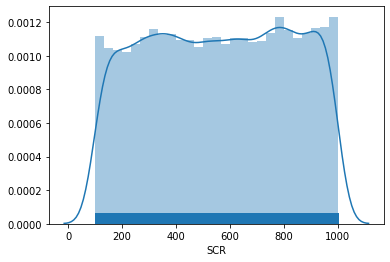

In [65]:
sns.distplot(data.SCR, hist=True, kde=True, rug=True)
plt.show()

In [66]:
data.SCR.describe()

count    19796.000000
mean       557.076531
std        260.559785
min        100.000000
25%        332.000000
50%        560.000000
75%        784.000000
max        999.000000
Name: SCR, dtype: float64

In [67]:
data.groupby(['Occupation','AgeGroup','Gender']).agg({'SCR':'mean'}).sort_values(['SCR'],ascending=True)

,,,SCR
Occupation,AgeGroup,Gender,
PROF,AgeRange_50to55,F,510.497537
SELF-EMP,AgeRange_50to55,F,519.604938
SAL,AgeRange_35to40,F,529.341176
PROF,AgeRange_35to40,F,533.273684
SAL,AgeRange_45to50,F,533.828125
SELF-EMP,AgeRange_30to35,F,535.851064
PROF,AgeRange_40to45,F,536.137255
SELF-EMP,AgeRange_45to50,F,538.018182
SENP,AgeRange_35to40,M,539.487179


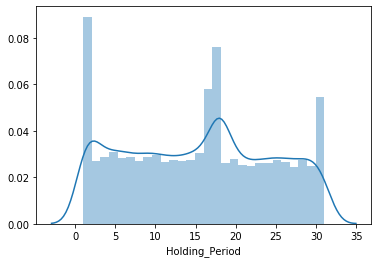

In [68]:
import seaborn as sns
sns.distplot(data.Holding_Period)

In [69]:
data.groupby('AgeGroup').agg({'Holding_Period':'mean'}).sort_values(['Holding_Period'],ascending=True)

,Holding_Period
AgeGroup,
AgeRange_35to40,15.175695
AgeRange_40to45,15.244624
AgeRange_30to35,15.279412
AgeRange_45to50,15.305200
AgeRange_50to55,15.306300
AgeRange_25to30,15.413793
AgeRange_20to25,15.890519


In [70]:
data.groupby('Occupation').agg({'Holding_Period':'mean'}).sort_values(['Holding_Period'],ascending=True)

,Holding_Period
Occupation,
SELF-EMP,15.014997
PROF,15.283671
SAL,15.365930
SENP,15.589647


In [71]:
data.groupby(['Occupation','AgeGroup','Gender']).agg({'Holding_Period':'mean'}).sort_values(['Holding_Period'],ascending=True)

Holding_Period
Occupation AgeGroup        Gender                
SAL        AgeRange_20to25 F            12.792453
SELF-EMP   AgeRange_35to40 M            14.136240
SAL        AgeRange_35to40 F            14.141176
SELF-EMP   AgeRange_50to55 M            14.306748
           AgeRange_40to45 M            14.717340
           AgeRange_50to55 F            14.740741
           AgeRange_30to35 M            14.740964
PROF       AgeRange_40to45 M            14.793460
SENP       AgeRange_35to40 M            14.877493
PROF       AgeRange_35to40 M            14.878623
SENP       AgeRange_40to45 M            14.886792
PROF       AgeRange_30to35 M            14.897547
SAL        AgeRange_45to50 M            14.913580
                           F            14.937500
PROF       AgeRange_30to35 F            14.984615
SAL        AgeRange_25to30 M            15.042476
SELF-EMP   AgeRange_45to50 M            15.058104
PROF       AgeRange_50to55 M            15.060855
           AgeRange_45to50 M            15.168207
SAL        AgeRange_40to45 M            15.267105
SELF-EMP   AgeRange_25to30 M            15.318310
SENP       AgeRange_45to50 M            15.345609
           AgeRange_50to55 M            15.366743
PROF       AgeRange_25to30 M            15.369863
SAL        AgeRange_30to35 M            15.376319
SENP       AgeRange_35to40 F            15.380282
SELF-EMP   AgeRange_45to50 F            15.400000
SENP       AgeRange_30to35 F            15.490196
SAL        AgeRange_50to55 M            15.497309
SELF-EMP   AgeRange_40to45 F            15.515873
SAL        AgeRange_25to30 F            15.525862
SELF-EMP   AgeRange_20to25 F            15.525974
SENP       AgeRange_25to30 M            15.531952
SAL        AgeRange_35to40 M            15.552301
SENP       AgeRange_30to35 M            15.645963
PROF       AgeRange_20to25 F            15.666667
           AgeRange_25to30 F            15.670330
           AgeRange_40to45 F            15.715686
           AgeRange_50to55 F            15.738916
SELF-EMP   AgeRange_25to30 F            15.775510
           AgeRange_30to35 F            15.780142
SENP       AgeRange_25to30 F            15.811138
           AgeRange_50to55 F            15.843854
PROF       AgeRange_20to25 M            15.959276
SENP       AgeRange_20to25 F            15.959698
SELF-EMP   AgeRange_20to25 M            15.993976
SENP       AgeRange_45to50 F            16.000000
SAL        AgeRange_50to55 F            16.000000
           AgeRange_20to25 M            16.008427
SENP       AgeRange_40to45 F            16.187320
SELF-EMP   AgeRange_35to40 F            16.313043
PROF       AgeRange_45to50 F            16.414747
SENP       AgeRange_20to25 M            16.549587
PROF       AgeRange_35to40 F            16.568421
SAL        AgeRange_40to45 F            16.672566
           AgeRange_30to35 F            16.742424

## Create Dummies

In [72]:
# Before data goes in for modeling, you have to convert categorical variables into dummies
data_dummy=pd.get_dummies(data)

In [73]:
# Check the top 5 records of dummy table
data_dummy.head(5)

,Target,Age,Balance,No_OF_CR_TXNS,SCR,Holding_Period,Gender_F,Gender_M,Occupation_PROF,Occupation_SAL,Occupation_SELF-EMP,Occupation_SENP,AgeGroup_AgeRange_20to25,AgeGroup_AgeRange_25to30,AgeGroup_AgeRange_30to35,AgeGroup_AgeRange_35to40,AgeGroup_AgeRange_40to45,AgeGroup_AgeRange_45to50,AgeGroup_AgeRange_50to55
0,0,41,91519.92,38,926,15,0,1,0,0,1,0,0,0,0,0,1,0,0
1,0,52,117288.96,17,768,13,0,1,0,1,0,0,0,0,0,0,0,0,1
2,0,31,259827.44,8,816,5,1,0,0,0,0,1,0,0,1,0,0,0,0
3,0,45,26677.55,14,353,18,1,0,1,0,0,0,0,0,0,0,1,0,0
4,0,39,43440.31,1,751,31,1,0,0,0,0,1,0,0,0,1,0,0,0


In [74]:
# Rename Single Column
data_dummy.rename(columns = {'Occupation_SELF-EMP':'Occupation_SELF_EMP'}, inplace = True)

In [75]:
# For sklearn library you have to separate out target varible data frame and Independent variables dataframe
# X ==> Data frame of independent variable 
# .values in the end covert the data frame to an array and sklearn library is comfortable working with arrays
X=data_dummy.drop(["Target","Age"],axis=1).values

In [76]:
#Print X
X

array([[9.1519920e+04, 3.8000000e+01, 9.2600000e+02, ..., 1.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [1.1728896e+05, 1.7000000e+01, 7.6800000e+02, ..., 0.0000000e+00,
        0.0000000e+00, 1.0000000e+00],
       [2.5982744e+05, 8.0000000e+00, 8.1600000e+02, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       ...,
       [1.0064227e+05, 4.0000000e+00, 2.6300000e+02, ..., 1.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [2.9950820e+04, 1.0000000e+01, 3.4500000e+02, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [4.8964550e+04, 4.0000000e+00, 8.0000000e+02, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00]])

In [77]:
# y ==> target variable
y=data_dummy['Target'].values

In [78]:
# Print array of y variable
y

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

## Undersampled data and oversampled data

### Creating a model with unbalanced data and measuring metrics

In [224]:
from sklearn.model_selection import train_test_split    
#train and test split

In [225]:
X_unbalanced = data_dummy.iloc[:,1:]
y_unbalanced = data_dummy.iloc[:,0]

In [81]:
X_train_un, X_test_un, y_train_un, y_test_un = train_test_split(X_unbalanced,y_unbalanced, shuffle = ['True'])

In [82]:
#decision tree
#import the class tree from sklearn
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

In [83]:
clf = DecisionTreeClassifier(max_depth = 5)
clf.fit(X_train_un, y_train_un)
y_prediction_un = clf.predict(X_test_un)

In [84]:
# Create a function for easy report printing
def print_classification_report(y_true, y_prediction, *type_of_report):
    accuracy = accuracy_score(y_true, y_prediction)
    precision = precision_score(y_true, y_prediction)
    recall = recall_score(y_true, y_prediction)
    f1 = f1_score(y_true, y_prediction)
    
    if type_of_report:
        print(color.BOLD + 'Classification Report on %s:' %type_of_report + color.END)
    else:
        print('Classification Report:')
    print()
    print('---------------------------------------')
    print('Accuracy: %s' %accuracy)
    print('Precision: %s' %precision)
    print(color.BOLD + 'Recall: %s' %recall + color.END)
    print('F1 score: %s' %f1)
    print('---------------------------------------')

# A class for pretty printing
class color:
    PURPLE = '\033[95m'
    CYAN = '\033[96m'
    DARKCYAN = '\033[36m'
    BLUE = '\033[94m'
    GREEN = '\033[92m'
    YELLOW = '\033[93m'
    RED = '\033[91m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'
    END = '\033[0m'

In [85]:
import sklearn.metrics
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score

In [86]:
print_classification_report(y_test_un, y_prediction_un, 'Unbalanced data')

Classification Report on Unbalanced data:

---------------------------------------
Accuracy: 0.9110931501313396
Precision: 0.5675675675675675
Recall: 0.13846153846153847
F1 score: 0.22261484098939932
---------------------------------------


### Create undersampled data and fit a model

In [87]:
#!pip install imblearn
!pip install -U imbalanced-learn

Requirement already up-to-date: imbalanced-learn in c:\users\hp\anaconda3\lib\site-packages (0.7.0)


In [88]:
import imblearn
from imblearn.under_sampling import NearMiss

In [89]:
X_under, y_under = NearMiss().fit_resample(X_unbalanced, y_unbalanced)

In [90]:
X_under_train, X_under_test, y_under_train, y_under_test = train_test_split(X_under, y_under)

In [91]:
clf_under_balanced = DecisionTreeClassifier()
clf_under_balanced.fit(X_under_train, y_under_train)
y_under_prediction = clf_under_balanced.predict(X_under_test)

In [92]:
print_classification_report(y_under_test,y_under_prediction, 'Undersampled data')

Classification Report on Undersampled data:

---------------------------------------
Accuracy: 0.7157894736842105
Precision: 0.7339667458432304
Recall: 0.7022727272727273
F1 score: 0.7177700348432056
---------------------------------------


### Create an oversampled dataset

In [226]:
from imblearn.over_sampling import SMOTE

In [227]:
X_over, y_over = SMOTE().fit_resample(X_unbalanced, y_unbalanced)

### Extremely Oversampled Dataset 

In [231]:
X_over_train, X_over_test, y_over_train, y_over_test = train_test_split(X_over, y_over)

In [96]:
clf_over_sampled = DecisionTreeClassifier()
clf_over_sampled.fit(X_over_train, y_over_train)

DecisionTreeClassifier()

In [97]:
y_over_predict = clf_over_sampled.predict(X_over_test)
print_classification_report(y_over_test, y_over_predict, 'Oversampled data')
print(color.BOLD + "THIS IS NOT A GOOD MODEL RIGHT NOW" + color.END)

Classification Report on Oversampled data:

---------------------------------------
Accuracy: 0.909000442282176
Precision: 0.898798228969007
Recall: 0.925531914893617
F1 score: 0.9119691945662638
---------------------------------------
THIS IS NOT A GOOD MODEL RIGHT NOW


## Decision Tree 

In [22]:
#decision tree
#import the class tree from sklearn
from sklearn import tree

In [23]:
from sklearn.model_selection import train_test_split    
#train and test split

In [24]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=4)

In [25]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(13857, 17)
(5939, 17)
(13857,)
(5939,)


In [26]:
mod=tree.DecisionTreeClassifier(max_depth=3)

In [27]:
mod.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=3)

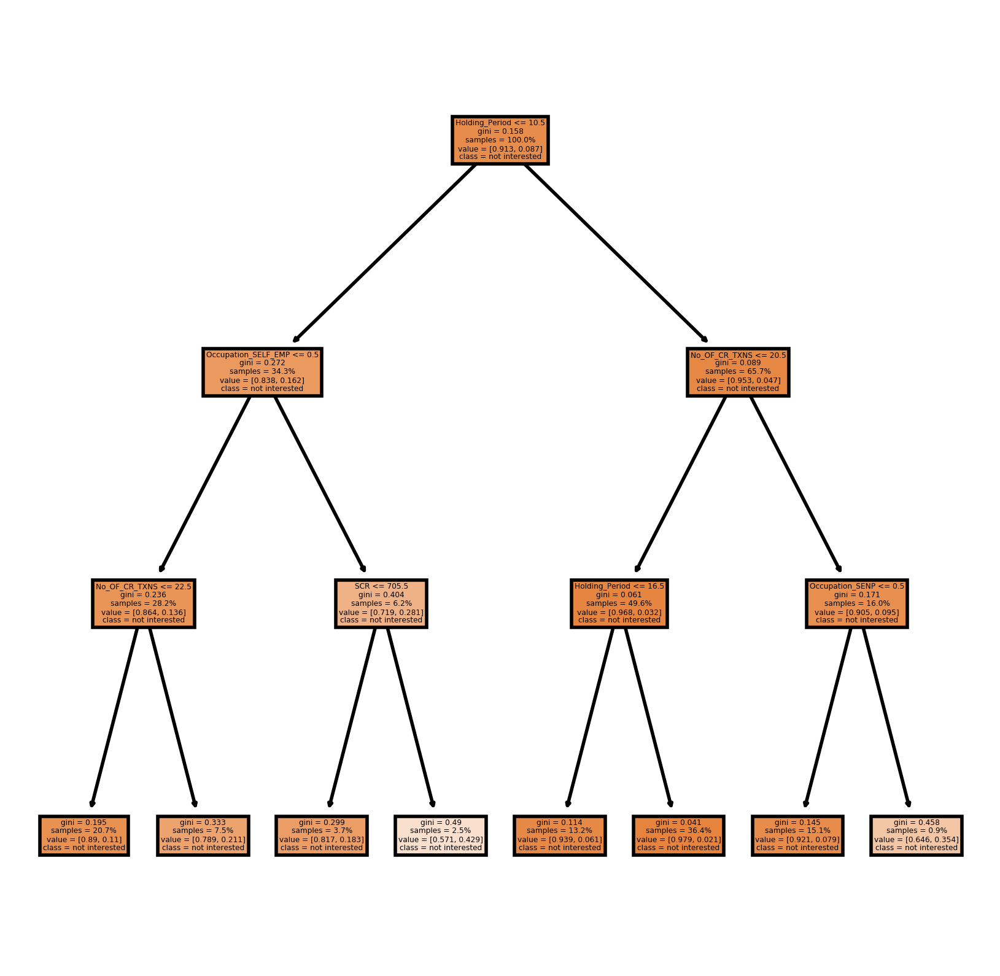

In [28]:
plt.figure(figsize=(5,5),dpi=400)
feature_names=data_dummy.drop(["Target","Age"],axis=1).columns
tree.plot_tree(mod,feature_names=feature_names.tolist(),class_names=["not interested","interested"],proportion=True,filled=True)
#tree.plot_tree(reg,feature_names=dm_model.columns.tolist(),\
            #  filled=True,proportion=True)
plt.show()

In [29]:
#display rules
plt.figure(figsize=None,dpi=800)
tree_rules=tree.export_text(mod, feature_names=feature_names.tolist())
print(tree_rules)

|--- Holding_Period <= 10.50
|   |--- Occupation_SELF_EMP <= 0.50
|   |   |--- No_OF_CR_TXNS <= 22.50
|   |   |   |--- class: 0
|   |   |--- No_OF_CR_TXNS >  22.50
|   |   |   |--- class: 0
|   |--- Occupation_SELF_EMP >  0.50
|   |   |--- SCR <= 705.50
|   |   |   |--- class: 0
|   |   |--- SCR >  705.50
|   |   |   |--- class: 0
|--- Holding_Period >  10.50
|   |--- No_OF_CR_TXNS <= 20.50
|   |   |--- Holding_Period <= 16.50
|   |   |   |--- class: 0
|   |   |--- Holding_Period >  16.50
|   |   |   |--- class: 0
|   |--- No_OF_CR_TXNS >  20.50
|   |   |--- Occupation_SENP <= 0.50
|   |   |   |--- class: 0
|   |   |--- Occupation_SENP >  0.50
|   |   |   |--- class: 0



<Figure size 4800x3200 with 0 Axes>

In [30]:
#Evaluate how my model is performing
#Accuracy, Confusion matrix, ROC, AUC

In [31]:
# Accuracy
predicted_labels=mod.predict(X_test)

In [32]:
predicted_labels

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [33]:
y_test

array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

In [34]:
y_test==predicted_labels

array([ True,  True,  True, ...,  True,  True, False])

In [35]:
(y_test==predicted_labels).sum()

5430

In [36]:
mod.score(X_test,y_test) # Accuracy on test data.

0.9142953359151372

In [37]:
mod.score(X_train,y_train) # Accuracy on train data. 

0.9134011690842173

In [38]:
#confusion matrix-Performance of a classification model

In [39]:
from sklearn import metrics

In [40]:
metrics.confusion_matrix(y_test,predicted_labels)

array([[5430,    0],
       [ 509,    0]], dtype=int64)

In [41]:
mod.predict_proba(X_test) 

array([[0.89032033, 0.10967967],
       [0.89032033, 0.10967967],
       [0.89032033, 0.10967967],
       ...,
       [0.92116579, 0.07883421],
       [0.9790099 , 0.0209901 ],
       [0.92116579, 0.07883421]])

In [42]:
#confusion matric at different threshold cut off
probs=mod.predict_proba(X_test)[:,1]
(probs>0.5).astype("int")
metrics.confusion_matrix(y_test,(probs>0.5).astype("int"))

array([[5430,    0],
       [ 509,    0]], dtype=int64)

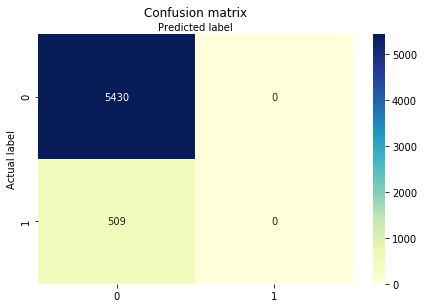

In [44]:
import seaborn as sns
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

sns.heatmap(pd.DataFrame(metrics.confusion_matrix(y_test,predicted_labels)),annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

In [45]:
print(metrics.classification_report(y_test, predicted_labels))
print(metrics.confusion_matrix(y_test, predicted_labels))
print(metrics.accuracy_score(y_test, predicted_labels))

              precision    recall  f1-score   support

           0       0.91      1.00      0.96      5430
           1       0.00      0.00      0.00       509

    accuracy                           0.91      5939
   macro avg       0.46      0.50      0.48      5939
weighted avg       0.84      0.91      0.87      5939

[[5430    0]
 [ 509    0]]
0.9142953359151372


C:\Users\hp\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [46]:
#AUC,ROC
auc=metrics.roc_auc_score(y_test,probs)
auc

0.7356076805349021

In [47]:
#ROC Curve
fpr,tpr,thr=metrics.roc_curve(y_test,probs)

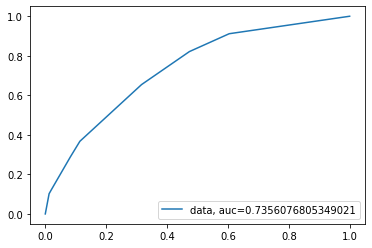

In [48]:
plt.plot(fpr,tpr,"-",label="data, auc="+str(auc)) 
plt.legend(loc=4)

### Feature importances as per DECISION TREE 

In [49]:
feat_imp=mod.feature_importances_  #feature importance
print(feat_imp)

[0.         0.15302284 0.1312317  0.46383009 0.         0.
 0.         0.         0.15567605 0.09623933 0.         0.
 0.         0.         0.         0.         0.        ]


In [50]:
feature_names

Index(['Balance', 'No_OF_CR_TXNS', 'SCR', 'Holding_Period', 'Gender_F',
       'Gender_M', 'Occupation_PROF', 'Occupation_SAL', 'Occupation_SELF_EMP',
       'Occupation_SENP', 'AgeGroup_AgeRange_20to25',
       'AgeGroup_AgeRange_25to30', 'AgeGroup_AgeRange_30to35',
       'AgeGroup_AgeRange_35to40', 'AgeGroup_AgeRange_40to45',
       'AgeGroup_AgeRange_45to50', 'AgeGroup_AgeRange_50to55'],
      dtype='object')

In [51]:
#Make a series object to get columns and feature importances
imp_feat1=pd.Series(mod.feature_importances_,index=feature_names).sort_values(ascending=False).head(17)
imp_feat1

Holding_Period              0.463830
Occupation_SELF_EMP         0.155676
No_OF_CR_TXNS               0.153023
SCR                         0.131232
Occupation_SENP             0.096239
Occupation_SAL              0.000000
Gender_F                    0.000000
Gender_M                    0.000000
Occupation_PROF             0.000000
AgeGroup_AgeRange_50to55    0.000000
AgeGroup_AgeRange_45to50    0.000000
AgeGroup_AgeRange_20to25    0.000000
AgeGroup_AgeRange_25to30    0.000000
AgeGroup_AgeRange_30to35    0.000000
AgeGroup_AgeRange_35to40    0.000000
AgeGroup_AgeRange_40to45    0.000000
Balance                     0.000000
dtype: float64

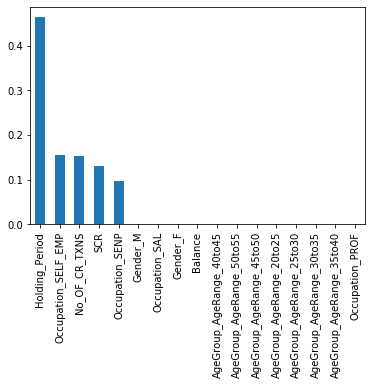

In [52]:
# Plotting bar chart of fetaures importances
imp_feat1.sort_values(ascending=False).plot(kind='bar')

Top 5 important features are as :
1. Holding_Period
2. No_OF_CR_TXNS
3. SCR
4. Occupation_SELF_EMP
5. Occupation_SENP

Now, let's run the logistic regression and check the variables which are effecting the target variable

## Running a logistic Regression and compare the result with DT

In [79]:
import statsmodels.formula.api as smf
import statsmodels.api as sm

In [80]:
dataLog=data.drop(["Age"],axis=1)

In [81]:
dataLog.head(2)

,Target,Gender,Balance,Occupation,No_OF_CR_TXNS,SCR,Holding_Period,AgeGroup
0,0,M,91519.92,SELF-EMP,38,926,15,AgeRange_40to45
1,0,M,117288.96,SAL,17,768,13,AgeRange_50to55


In [82]:
train=dataLog.sample(frac=0.70,random_state=42)

In [83]:
test=dataLog.drop(train.index,axis=0)

In [84]:
train.head(2)

,Target,Gender,Balance,Occupation,No_OF_CR_TXNS,SCR,Holding_Period,AgeGroup
18115,0,M,35972.38,SAL,24,891,9,AgeRange_30to35
13736,0,M,19216.45,PROF,45,926,27,AgeRange_30to35


In [85]:
test.head(2)

,Target,Gender,Balance,Occupation,No_OF_CR_TXNS,SCR,Holding_Period,AgeGroup
2,0,F,259827.44,SENP,8,816,5,AgeRange_30to35
9,1,M,10791.71,SELF-EMP,17,678,3,AgeRange_40to45


In [86]:
train.dtypes

Target              int64
Gender             object
Balance           float64
Occupation         object
No_OF_CR_TXNS       int64
SCR                 int64
Holding_Period      int64
AgeGroup           object
dtype: object

In [87]:
print(train.shape)
print(test.shape)

(13857, 8)
(5939, 8)


In [88]:
modLogReg=smf.glm("Target~Gender+Balance+Occupation+No_OF_CR_TXNS+SCR+Holding_Period+AgeGroup",data=train,family=sm.families.Binomial())

In [89]:
#fit the model
modLoRegRes=modLogReg.fit()

In [90]:
print(modLoRegRes.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                 Target   No. Observations:                13857
Model:                            GLM   Df Residuals:                    13842
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3601.7
Date:                Sun, 08 Nov 2020   Deviance:                       7203.5
Time:                        00:25:56   Pearson chi2:                 1.42e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept         

Observations:

1. Only Balance, Occupation_SAL, Occupation_SELF_EMP, No_OF_CR_TXNS, SCR and Holding_Period are having p-value less than 0.05. These independent variables are having effect on the dependent variable 'Target'. Therefore, we will remove all other variables whose p-value is greater than 0.05
2. Time to run this model 16:41 

In [91]:
print(modLoRegRes.aic) #AIC

7233.479099784048


Akaike information criterion (AIC):
AIC estimates the relative amount of information lost by a given model: 
the less information a model loses, the higher the quality of that model. 

AIC = -2/N * LL + 2 * k/N
Where N is the number of examples in the training dataset, 
LL is the log-likelihood of the model on the training dataset,
and k is the number of parameters in the model.

The score, as defined above, is minimized, e.g. the model with the lowest AIC is selected.

In [92]:
train=data_dummy.sample(frac=0.70,random_state=42)

In [93]:
test=data_dummy.drop(train.index,axis=0)

In [94]:
#+AgeGroup_AgeRange_40to45
modLogReg2=smf.glm("Target~Balance+Occupation_SAL+Occupation_SELF_EMP+No_OF_CR_TXNS+SCR+Holding_Period",data=train,family=sm.families.Binomial())

This is the model obtained by considering only the variables which are effecting the target variable

In [95]:
modLoRegRes2=modLogReg2.fit()
print(modLoRegRes2.summary())
print(modLoRegRes2.aic)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                 Target   No. Observations:                13857
Model:                            GLM   Df Residuals:                    13850
Model Family:                Binomial   Df Model:                            6
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3612.1
Date:                Sun, 08 Nov 2020   Deviance:                       7224.2
Time:                        00:26:07   Pearson chi2:                 1.42e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept              -2.2002    

Observations and conclusions:

1. Independent variables-Balance, Occupation_SAL, Occupation_SELF_EMP, No_OF_CR_TXNS, SCR and Holding_Period are having p-value less than 0.05. They are impacting the dependent variable 'Target'. As per the output of the feature importance of Decision tree Classifier, the sequence of these independent variables as per their importances are:
   
   a) Holding_Period
   
   b) No_OF_CR_TXNS
   
   c) Occupation_SAL
   
   d) SCR
   
   e) Occupation_SELF_EMP
   
   f) Balance

2. Time taken to run the model: 16:59 (same as above)
3. Log-Likelihood of our model is -3612.1. The likelihood function is the probability that the observed data were generated by a given set of parameter values.
4. Under the coef column, the Intercept row has a value of -2.2002. This means that when the value of all the variables are 0, the predicted log-odds of having a value of 1 on Outcome (i.e, being classified as interested) is -2.2002. 
5. The value of 0.0311 for No_OF_CR_TXNS in the coef column means that for each unit increase in the value of No_OF_CR_TXNS, the log-odds of being classified as interested increases by a value of 0.0311. 
6. Similarly,the value of  -0.0953 for Holding_Period in the coef column means that for each unit increase in the value of Holding_Period, the log-odds of being classified as interested decreases by a value of 0.0953. 
7. Log-odds are not terribly intuitive, which is why we want to eventually predict probabilities from our model. 


In [96]:
predicted_prob=modLoRegRes2.predict(test)
predicted_prob

2        0.125500
9        0.344629
11       0.034157
13       0.325880
16       0.015144
           ...   
19986    0.185641
19992    0.041670
19994    0.040632
19997    0.082437
19999    0.068117
Length: 5939, dtype: float64

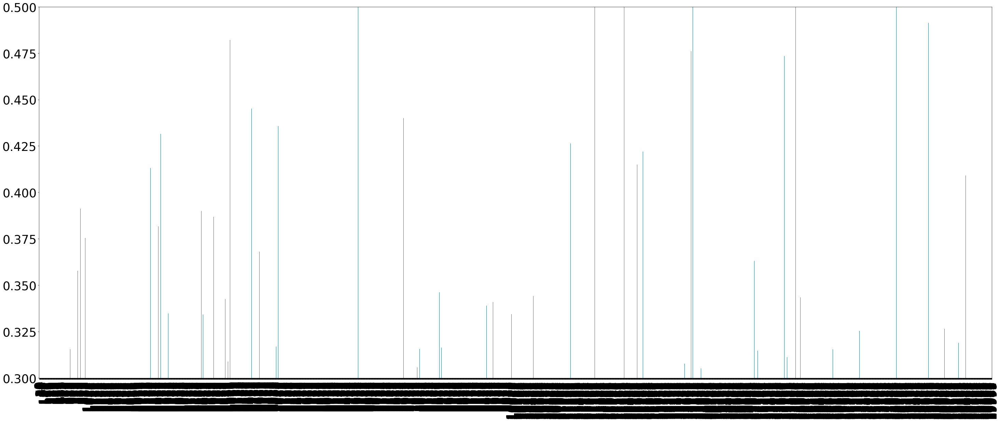

In [78]:
predicted_prob.plot(figsize=(50,20),kind='bar',fontsize=35,ylim=(0.3,0.5))

In [97]:
predictions=modLoRegRes2.predict(test)
print(predictions[:].head())

2     0.125500
9     0.344629
11    0.034157
13    0.325880
16    0.015144
dtype: float64


In [98]:
#Confusion matrix
#Getting class predictions
#List comprehensions
predictions_nominal=[1 if p>=0.5 else 0 for p in predictions]

In [99]:
print(predictions_nominal[0:20])

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [100]:
from sklearn import metrics

In [101]:
import sklearn.metrics
metrics.confusion_matrix(test.Target,predictions_nominal)

array([[5460,    5],
       [ 467,    7]], dtype=int64)

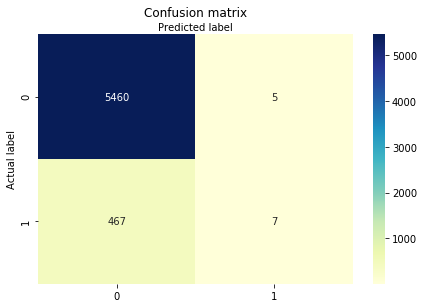

In [102]:
import seaborn as sns
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

sns.heatmap(pd.DataFrame(metrics.confusion_matrix(test.Target,predictions_nominal)),annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

In [103]:
#TP   FP
#FN   TN
print(metrics.classification_report(test.Target,predictions_nominal))
print(metrics.confusion_matrix(test.Target,predictions_nominal))
print("Accuracy score: ",metrics.accuracy_score(test.Target,predictions_nominal))
print("Precision:",metrics.precision_score(test.Target,predictions_nominal))
print("Recall:",metrics.recall_score(test.Target,predictions_nominal))

              precision    recall  f1-score   support

           0       0.92      1.00      0.96      5465
           1       0.58      0.01      0.03       474

    accuracy                           0.92      5939
   macro avg       0.75      0.51      0.49      5939
weighted avg       0.89      0.92      0.88      5939

[[5460    5]
 [ 467    7]]
Accuracy score:  0.9205253409664926
Precision: 0.5833333333333334
Recall: 0.014767932489451477


Format of Confusion Matrix:

               Predicted
               0     1
   
   Actual
   
              0 TP   FP

              1 FN   TN

1. Accuracy:
    Accuracy is the fraction of predictions our model got right. Formally, accuracy has the following definition:
    
    Accuracy= (Number of correct predictions)/(Total number of Predictions)

    For binary classification, accuracy can also be calculated in terms of positives and negatives as follows:
    
    Accuracy=(TP+TN)/(TP+TN+FP+FN)
    Where TP = True Positives, TN = True Negatives, FP = False Positives, and FN = False Negatives
    
    Here. Accuracy=92.05%
    It means that with 91.96% predictions are right
    
2. Precision: It attempts to answer "What proportion of positive identifications was actually correct?". 
              A model that produces  no false positives has a precision of 1.0.
    
    Precision= TP/(TP+FP)
    
    Here, FP=5, Therefore, Precision=58.33%
    
    It means that when the model predicts a customer is not interested, it is correct 100% of the time. 
    Hundred percent of positive identifications was actually correct
    
3. Recall: It attempts to answer "What proportion of actual positives was identified correctly". 
            A model that produces  no false negatives has a precision of 1.0.
    
    Recall= TP/(TP+FN)
    
    Here, FN=467, Therefore, Recall=0.014 (1.4%)
    
    It means that when the model correctly predicts 1.4% of all non-interested customers. 
    1.4% of actual positives was identified correctly
    
    

In [104]:
auc1=metrics.roc_auc_score(test.Target,predictions)  #AUC
auc1

0.7643369196382039

In [105]:
fpr,tpr,thr=metrics.roc_curve(test.Target,predictions)

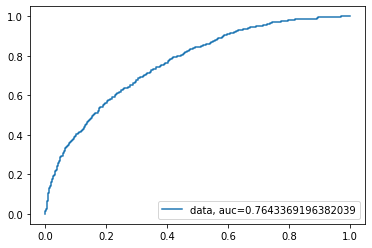

In [106]:
plt.plot(fpr,tpr,"-",label="data, auc="+str(auc1))
plt.legend(loc=4)

## Identification of profitable segment to do customized marketing

In [107]:
data1= data_dummy.drop(['Age'],axis=1)

In [108]:
data1.head(2)

,Target,Balance,No_OF_CR_TXNS,SCR,Holding_Period,Gender_F,Gender_M,Occupation_PROF,Occupation_SAL,Occupation_SELF_EMP,Occupation_SENP,AgeGroup_AgeRange_20to25,AgeGroup_AgeRange_25to30,AgeGroup_AgeRange_30to35,AgeGroup_AgeRange_35to40,AgeGroup_AgeRange_40to45,AgeGroup_AgeRange_45to50,AgeGroup_AgeRange_50to55
0,0,91519.92,38,926,15,0,1,0,0,1,0,0,0,0,0,1,0,0
1,0,117288.96,17,768,13,0,1,0,1,0,0,0,0,0,0,0,0,1


In [109]:
data_dummy.head(2)

,Target,Age,Balance,No_OF_CR_TXNS,SCR,Holding_Period,Gender_F,Gender_M,Occupation_PROF,Occupation_SAL,Occupation_SELF_EMP,Occupation_SENP,AgeGroup_AgeRange_20to25,AgeGroup_AgeRange_25to30,AgeGroup_AgeRange_30to35,AgeGroup_AgeRange_35to40,AgeGroup_AgeRange_40to45,AgeGroup_AgeRange_45to50,AgeGroup_AgeRange_50to55
0,0,41,91519.92,38,926,15,0,1,0,0,1,0,0,0,0,0,1,0,0
1,0,52,117288.96,17,768,13,0,1,0,1,0,0,0,0,0,0,0,0,1


In [110]:
predicted_prob1=modLoRegRes2.predict(data1)
predicted_prob1

0        0.271462
1        0.063410
2        0.125500
3        0.040034
4        0.011383
           ...   
19995    0.016798
19996    0.080273
19997    0.082437
19998    0.010446
19999    0.068117
Length: 19796, dtype: float64

In [111]:
predicted_prob1.values

array([0.27146224, 0.06341009, 0.12549955, ..., 0.08243657, 0.01044588,
       0.06811695])

In [112]:
data1['predicted_probability']=predicted_prob1.values

In [113]:
data_dummy.head(2)

,Target,Age,Balance,No_OF_CR_TXNS,SCR,Holding_Period,Gender_F,Gender_M,Occupation_PROF,Occupation_SAL,Occupation_SELF_EMP,Occupation_SENP,AgeGroup_AgeRange_20to25,AgeGroup_AgeRange_25to30,AgeGroup_AgeRange_30to35,AgeGroup_AgeRange_35to40,AgeGroup_AgeRange_40to45,AgeGroup_AgeRange_45to50,AgeGroup_AgeRange_50to55
0,0,41,91519.92,38,926,15,0,1,0,0,1,0,0,0,0,0,1,0,0
1,0,52,117288.96,17,768,13,0,1,0,1,0,0,0,0,0,0,0,0,1


In [114]:
data1.head (2)

,Target,Balance,No_OF_CR_TXNS,SCR,Holding_Period,Gender_F,Gender_M,Occupation_PROF,Occupation_SAL,Occupation_SELF_EMP,Occupation_SENP,AgeGroup_AgeRange_20to25,AgeGroup_AgeRange_25to30,AgeGroup_AgeRange_30to35,AgeGroup_AgeRange_35to40,AgeGroup_AgeRange_40to45,AgeGroup_AgeRange_45to50,AgeGroup_AgeRange_50to55,predicted_probability
0,0,91519.92,38,926,15,0,1,0,0,1,0,0,0,0,0,1,0,0,0.271462
1,0,117288.96,17,768,13,0,1,0,1,0,0,0,0,0,0,0,0,1,0.063410


In [115]:
data1.loc[((data1['predicted_probability']==0)), 'Customer_Segment']="Not_interested_0"
data1.loc[((data1['predicted_probability']>0) & (data1['predicted_probability']<=0.2)), 'Customer_Segment']="Likely_not_interesed_closeTo_0"
data1.loc[((data1['predicted_probability']>0.2) & (data1['predicted_probability']<=0.3)), 'Customer_Segment']="Segment1 (>0.2 to 0.3)"
data1.loc[((data1['predicted_probability']>0.3) & (data1['predicted_probability']<=0.4)), 'Customer_Segment']="Segment1 (>0.3 to 0.4)"
data1.loc[((data1['predicted_probability']>0.4) & (data1['predicted_probability']<=0.5)), 'Customer_Segment']="Segment2 (>0.4 to 0.5)"
data1.loc[((data1['predicted_probability']>0.5) & (data1['predicted_probability']<=0.6)), 'Customer_Segment']="Segment3 (>0.5 to 0.6)"
data1.loc[((data1['predicted_probability']>0.6) & (data1['predicted_probability']<=0.7)), 'Customer_Segment']="Segment4 (>0.6 to 0.7)"
data1.loc[((data1['predicted_probability']>0.7) & (data1['predicted_probability']<=0.8)), 'Customer_Segment']="Segment4 (>0.7 to 0.8)"
data1.loc[((data1['predicted_probability']>0.8) & (data1['predicted_probability']<1)), 'Customer_Segment']="Likely_interesed_closeTo_1"
data1.loc[((data1['predicted_probability']==1)), 'Customer_Segment']="Interested_1"

In [116]:
data1.head(2)

,Target,Balance,No_OF_CR_TXNS,SCR,Holding_Period,Gender_F,Gender_M,Occupation_PROF,Occupation_SAL,Occupation_SELF_EMP,Occupation_SENP,AgeGroup_AgeRange_20to25,AgeGroup_AgeRange_25to30,AgeGroup_AgeRange_30to35,AgeGroup_AgeRange_35to40,AgeGroup_AgeRange_40to45,AgeGroup_AgeRange_45to50,AgeGroup_AgeRange_50to55,predicted_probability,Customer_Segment
0,0,91519.92,38,926,15,0,1,0,0,1,0,0,0,0,0,1,0,0,0.271462,Segment1 (>0.2 to 0.3)
1,0,117288.96,17,768,13,0,1,0,1,0,0,0,0,0,0,0,0,1,0.063410,Likely_not_interesed_closeTo_0


In [117]:
#data1[(data1.Customer_Segment=='Profitable_Segment_to_target')]. Customer_Segment

In [118]:
#data1[(data1.Customer_Segment=='Profitable_Segment_to_target')]. Customer_Segment.value_counts()

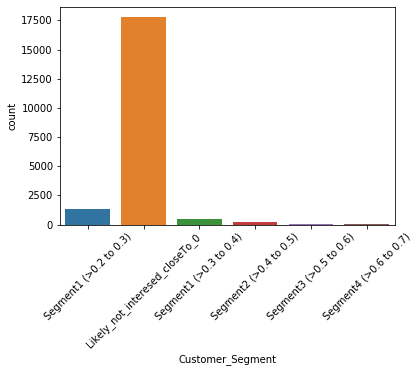

In [119]:
sns.countplot(data1.Customer_Segment)
plt.xticks(rotation=45)
plt.show()

In [121]:
pd.crosstab(data1.Customer_Segment,data1.Target)

Target,0,1
Customer_Segment,,
Likely_not_interesed_closeTo_0,16641,1107
Segment1 (>0.2 to 0.3),1028,311
Segment1 (>0.3 to 0.4),300,171
Segment2 (>0.4 to 0.5),94,82
Segment3 (>0.5 to 0.6),19,31
Segment4 (>0.6 to 0.7),5,7


In [122]:
data1.Customer_Segment.value_counts()

Likely_not_interesed_closeTo_0    17748
Segment1 (>0.2 to 0.3)             1339
Segment1 (>0.3 to 0.4)              471
Segment2 (>0.4 to 0.5)              176
Segment3 (>0.5 to 0.6)               50
Segment4 (>0.6 to 0.7)               12
Name: Customer_Segment, dtype: int64

In [123]:
data1.Customer_Segment.value_counts()/data.shape[0]

Likely_not_interesed_closeTo_0    0.896545
Segment1 (>0.2 to 0.3)            0.067640
Segment1 (>0.3 to 0.4)            0.023793
Segment2 (>0.4 to 0.5)            0.008891
Segment3 (>0.5 to 0.6)            0.002526
Segment4 (>0.6 to 0.7)            0.000606
Name: Customer_Segment, dtype: float64

In [176]:
#stored on computer as Customer_Segment file - convert to dataframe

In [128]:
import pandas as pd
Customer_Segment = pd.DataFrame(data1)

In [129]:
Customer_Segment.to_csv("C:\\Users\\hp\\Downloads\\Download\\PERSONAL\\IIM Indore IPBA\\Class\\Project\\Customer_Segment.csv",index=False,columns=None)

Observations:
1. 709 customers are falling under the segment of 'Profitable_Segment_to_target'(segment covering the customers between 0.3 to 0.7. They can be considered as profitable segment for customized marketing by minimizing the cost
2. Percentage of customers falling under profitable segment for customized marketing by minimizing the cost= 3.58%
3. These customers can directly be accessed by the Bank

## Random Forest Classifier

In [18]:
# Steps to create a model
# 1. Create a train data and a test data for model validation
# 2. Create an object of the ensemble class (clf) which will be a Ensemble of DT Classifier object...
# ...(Bagging or RF classifier/ Regressor)
# 3. Instantiate the object of the class with its required method (Bagging/ RF )
# 4. Fit the model with input data - X_train,y_train using fit method of clf
# 5. Predit the output lablels (in case of classification) or continpus target variable(in case of regression) on test data
# 6. Validate/ Score the model on test set and compare the predicted outcome with actual labels/ target continous variable

In [45]:
# Import train and test data split class
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=400)

In [46]:
print(X.shape)
print(X_train.shape)
print(X_test.shape)

(19796, 17)
(13857, 17)
(5939, 17)


In [47]:
# Import library for ensemble models
from sklearn import ensemble  # This is my ensemble class

In [48]:
# Import random forest classifier class
from sklearn.ensemble import RandomForestClassifier

In [95]:
# Create multiple ensembles in a range with steps
for n_trees in range(10,600,20):
    #clf=RandomForestClassifier(n_estimators=w,oob_score=True,n_jobs=-1,random_state=400)
    clf=RandomForestClassifier(n_estimators=n_trees, oob_score=True, n_jobs=-1,random_state=400)
    clf.fit(X_train,y_train)
    oob=clf.oob_score_
    print ('For n_estimators = '+str(n_trees))
    print ('OOB score is '+str(oob))
    print ('************************')

C:\Users\hp\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:540: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
C:\Users\hp\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:545: RuntimeWarning: invalid value encountered in true_divide
  predictions[k].sum(axis=1)[:, np.newaxis])


For n_estimators = 10
OOB score is 0.9045247889153496
************************
For n_estimators = 30
OOB score is 0.9146279858555243
************************
For n_estimators = 50
OOB score is 0.916720790935989
************************
For n_estimators = 70
OOB score is 0.9170094537057083
************************
For n_estimators = 90
OOB score is 0.9180919390921556
************************
For n_estimators = 110
OOB score is 0.9185249332467345
************************
For n_estimators = 130
OOB score is 0.9184527675543047
************************
For n_estimators = 150
OOB score is 0.9186692646315942
************************
For n_estimators = 170
OOB score is 0.9186692646315942
************************
For n_estimators = 190
OOB score is 0.9185249332467345
************************
For n_estimators = 210
OOB score is 0.9189579274013134
************************
For n_estimators = 230
OOB score is 0.918741430324024
************************
For n_estimators = 250
OOB score is 0.918741430

In [49]:
#Finalize  trees
clf=RandomForestClassifier(n_estimators=490,oob_score=True,n_jobs=-1,random_state=400)

In [50]:
# Fit final model
clf.fit(X_train,y_train)

RandomForestClassifier(n_estimators=490, n_jobs=-1, oob_score=True,
                       random_state=400)

In [51]:
# Get average OOB score of the model for 250 trees
clf.oob_score_

0.9197517500180414

In [52]:
# Test data validation for 490 trees
clf.score(X_test,y_test)

#?? What do you think will clf.score(X_train,y_train) give in the output?? How is this different from OOB_score
## Ans. this will give accuracy of the entire model on the train data, which could be effected by overfitting
## On the other hand OOB score is validating the model while it is getting trained using bootstrap sampling

0.9198518269068867

In [53]:
# Predict labels on test data
clf.predict(X_test)

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [230]:
# 250 tress/ estimators
clf.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=724685148),
 DecisionTreeClassifier(max_features='auto', random_state=1252593103),
 DecisionTreeClassifier(max_features='auto', random_state=970656062),
 DecisionTreeClassifier(max_features='auto', random_state=807842745),
 DecisionTreeClassifier(max_features='auto', random_state=1543176332),
 DecisionTreeClassifier(max_features='auto', random_state=1015616499),
 DecisionTreeClassifier(max_features='auto', random_state=1247232407),
 DecisionTreeClassifier(max_features='auto', random_state=1454861574),
 DecisionTreeClassifier(max_features='auto', random_state=636582133),
 DecisionTreeClassifier(max_features='auto', random_state=1466331272),
 DecisionTreeClassifier(max_features='auto', random_state=51747435),
 DecisionTreeClassifier(max_features='auto', random_state=1015100607),
 DecisionTreeClassifier(max_features='auto', random_state=1186072774),
 DecisionTreeClassifier(max_features='auto', random_state=1854299675),
 DecisionTre

In [54]:
# Getting feature importances (alre)
clf.feature_importances_

array([0.2236738 , 0.18245134, 0.23044627, 0.17791453, 0.01233731,
       0.01250528, 0.01389317, 0.01712205, 0.01866982, 0.01756246,
       0.0094138 , 0.01382812, 0.01425734, 0.01373824, 0.01505208,
       0.01361421, 0.01352018])

In [55]:
# Getting feature names
feature_names = data_dummy.drop(["Target","Age"], axis = 1).columns
feature_names.tolist()

['Balance',
 'No_OF_CR_TXNS',
 'SCR',
 'Holding_Period',
 'Gender_F',
 'Gender_M',
 'Occupation_PROF',
 'Occupation_SAL',
 'Occupation_SELF_EMP',
 'Occupation_SENP',
 'AgeGroup_AgeRange_20to25',
 'AgeGroup_AgeRange_25to30',
 'AgeGroup_AgeRange_30to35',
 'AgeGroup_AgeRange_35to40',
 'AgeGroup_AgeRange_40to45',
 'AgeGroup_AgeRange_45to50',
 'AgeGroup_AgeRange_50to55']

In [56]:
# Appending feature names
imp_feat=pd.Series(clf.feature_importances_,index=feature_names.tolist())

In [57]:
# Sorting by feature importances
imp_feat.sort_values(ascending=False)

SCR                         0.230446
Balance                     0.223674
No_OF_CR_TXNS               0.182451
Holding_Period              0.177915
Occupation_SELF_EMP         0.018670
Occupation_SENP             0.017562
Occupation_SAL              0.017122
AgeGroup_AgeRange_40to45    0.015052
AgeGroup_AgeRange_30to35    0.014257
Occupation_PROF             0.013893
AgeGroup_AgeRange_25to30    0.013828
AgeGroup_AgeRange_35to40    0.013738
AgeGroup_AgeRange_45to50    0.013614
AgeGroup_AgeRange_50to55    0.013520
Gender_M                    0.012505
Gender_F                    0.012337
AgeGroup_AgeRange_20to25    0.009414
dtype: float64

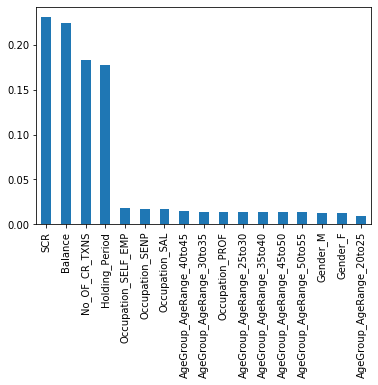

In [58]:
# Plotting bar chart of fetaures importances
imp_feat.sort_values(ascending=False).plot(kind='bar')

Observations and conclusions:

With reference to the obtained output of logistic regression, independent variables-Balance, Occupation_SAL, Occupation_SELF_EMP, AgeGroup_AgeRange_40to45, No_OF_CR_TXNS, SCR and Holding_Period are effecting the target variable. 

Now, as per the feature importance of Random Forest, the sequence of these independent variables as per their importances are:

a) SCR

b) Balance

c) No_OF_CR_TXNS

d) Holding_Period

e) Occupation_SELF_EMP

The sequence of feature importance is a bit different from the output of DT. But, the variables are same.

In [236]:
# Confusion Matrix and AUC
#### How good is it when it comes to making predictions?
## Accuracy? test_data
predicted_labels=clf.predict(X_test)
predicted_labels

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [237]:
# Predcting the probability of not taken loan and taken loan
# It will give an array of 0 and 1 class (not taken loan and taken loan respectively)
probs = clf.predict_proba(X_test)
probs

array([[0.5244898 , 0.4755102 ],
       [0.96734694, 0.03265306],
       [0.99387755, 0.00612245],
       ...,
       [0.64489796, 0.35510204],
       [0.98163265, 0.01836735],
       [0.98979592, 0.01020408]])

In [238]:
### Confusion Matrix
from sklearn import metrics
# Plot confusion matrix
metrics.confusion_matrix(y_test,predicted_labels)

array([[5401,   31],
       [ 445,   62]], dtype=int64)

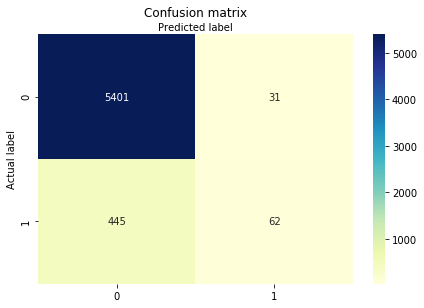

In [239]:
import seaborn as sns
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

sns.heatmap(pd.DataFrame(metrics.confusion_matrix(y_test,predicted_labels)),annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

In [240]:
print(metrics.classification_report(y_test,predicted_labels))
print(metrics.confusion_matrix(y_test,predicted_labels))
print("Accuracy score: ",metrics.accuracy_score(y_test,predicted_labels))
print("Precision:",metrics.precision_score(y_test,predicted_labels))
print("Recall:",metrics.recall_score(y_test,predicted_labels))

              precision    recall  f1-score   support

           0       0.92      0.99      0.96      5432
           1       0.67      0.12      0.21       507

    accuracy                           0.92      5939
   macro avg       0.80      0.56      0.58      5939
weighted avg       0.90      0.92      0.89      5939

[[5401   31]
 [ 445   62]]
Accuracy score:  0.9198518269068867
Precision: 0.6666666666666666
Recall: 0.1222879684418146


Format of Confusion Matrix:

               Predicted
               0     1
   
   Actual
   
              0 TP   FP

              1 FN   TN

1. Accuracy:
    
    Here. Accuracy=91.98%
    It means that with 91.98% predictions are right
    
2. Precision: 
    Precision=66.67%
    
    It means that when the model predicts a customer is not interested, it is correct 66.67% of the time. 
    66.67% of positive identifications was actually correct
    
3. Recall: 
    Recall=12.22%
    
    It means that when the model correctly predicts 12.22% of all non-interested customers. 
    12.22% of actual positives was identified correctly
    
    

In [241]:
#### Confusion Matrix relies on a threshold that I choose
#### AUC
probs_tloan = probs[:,1]
auc_rf=metrics.roc_auc_score(y_test,probs_tloan)  # probs[:,1] >> first columns of not taken loan and taken loan array of probabilities
auc_rf

0.7755357251788655

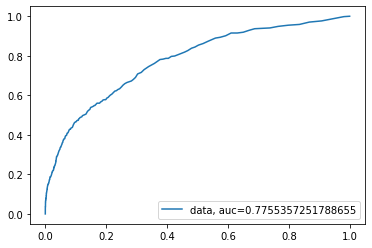

In [242]:
# Getting FPR, TPR and Threshold
fpr,tpr,thr=metrics.roc_curve(y_test,probs_tloan)
# Plotting ROC
plt.plot(fpr,tpr,"-",label="data, auc="+str(auc_rf))
plt.legend(loc=4)

With AUC=77.55%, the model looks good.
Let's try other models as well.

# ----Local Interpretable Model-agnostic Explanations (LIME)----

In [40]:
#!pip install lime

In [243]:
#Import LIME package
import lime
import lime.lime_tabular

In [104]:
#from lime import lime_text
#from sklearn.pipeline import make_pipeline

LIME ( Local Interpretable Model-agnostic Explanations )is a technique which explains the prediction of any classifier in an interpretable manner by learning an interpretable model locally around the prediction.

In [244]:
#Create the Explainer
predict_fn_clf = lambda x: clf.predict_proba(x).astype(float)
explainer = lime.lime_tabular.LimeTabularExplainer(X,feature_names = feature_names,class_names=['not interested','interested'],kernel_width=5)

In [245]:
#Use the explainer to explain predictions
#Explaining Instance 1
choosen_instance = X_test[1223]
exp = explainer.explain_instance(choosen_instance, predict_fn_clf,num_features=17)
exp.show_in_notebook(show_all=False)

In [246]:
#Explaining Instance 2
choosen_instance = X[13275]
exp = explainer.explain_instance(choosen_instance, predict_fn_clf,num_features=17)
exp.show_in_notebook(show_all=False)

In [247]:
#Explaining Instance 3
choosen_instance = X_test[139]
exp = explainer.explain_instance(choosen_instance, predict_fn_clf,num_features=17)
exp.show_in_notebook(show_all=False)

In [248]:
#Explaining Instance 4
choosen_instance = X[7037]
exp = explainer.explain_instance(choosen_instance, predict_fn_clf,num_features=17)
exp.show_in_notebook(show_all=False)

Observations:
    
1. The left most section is displaying prediction probabilities
2. The middle section is displaying 17 features. The features effecting the most (important feature) to the prediction probability are at the top. 
3. For the binary classification task, it is in 2 colors orange/blue. 
   Attributes in orange is supporting class 1 (interested customers) and those in blue are supporting class 0 (not-interest customers). 
4. The color-coding is consistent across sections. It contains the actual values of the variables.
5. As per the output , following variables are effecting the most in local environment (that is in each row):

   a) Holding_Period
   
   b) No_OF_CR_TXNS
   
   c) Occupation_SAL
   
   d) SCR
   
   e) Occupation_SELF_EMP
   
   f) Balance


In [212]:
# Code for SP-LIME
#import lime
import warnings
from lime import submodular_pick

Submodular pick ( SP-LIME ):

In order to make the model easily understandable, SP-LLIME  is being run. It run the explanation model on a diverse but representative set of instances to return a nonredundant explanation set that is a global representation of the model.

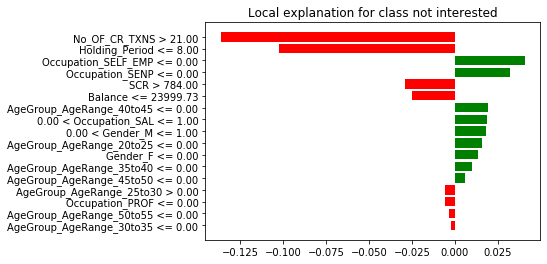

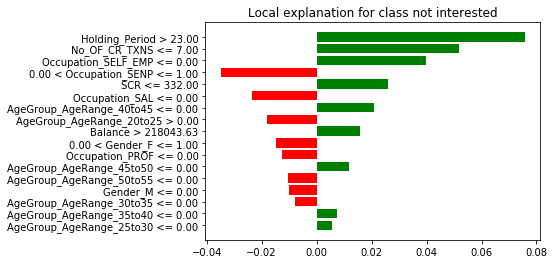

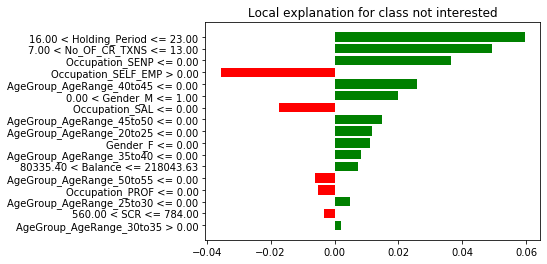

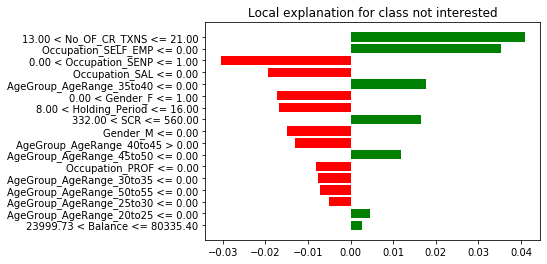

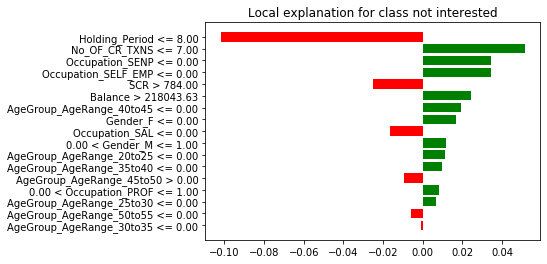

In [249]:
# SP-LIME returns exaplanations on a sample set to provide a non redundant global decision boundary of original model
from lime import submodular_pick
sp_obj = submodular_pick.SubmodularPick(explainer, X_train, clf.predict_proba, sample_size=500, num_features=17, num_exps_desired=5)
[exp.as_pyplot_figure(label=exp.available_labels()[0]) for exp in sp_obj.sp_explanations];

Observations from the output of SP-LIME:

It also shows the important features from the set of instances. Following variables are effecting the most:

a) Holding_Period

b) No_OF_CR_TXNS

c) Occupation_SAL

d) SCR

e) Occupation_SELF_EMP

f) Balance

In [112]:
#!pip install plotly

In [ ]:
#!pip install chart-studio

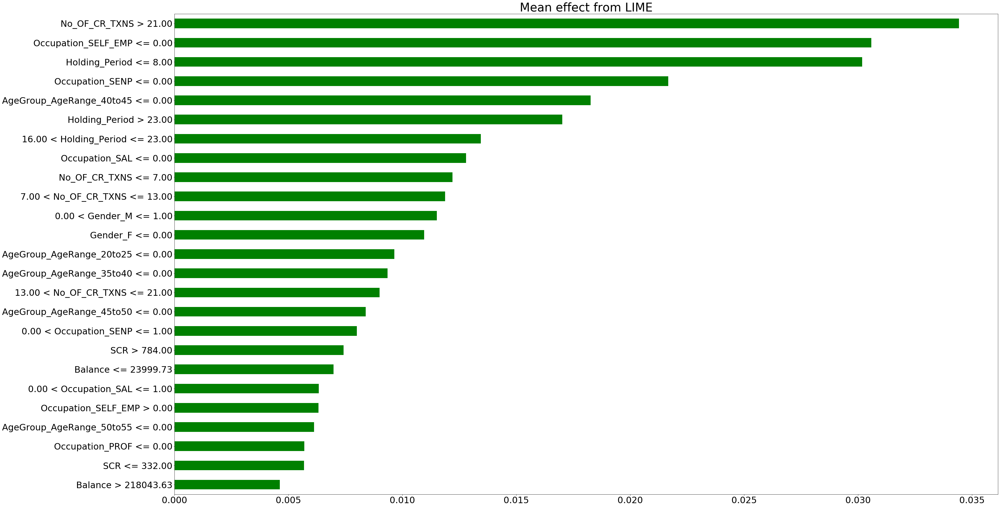

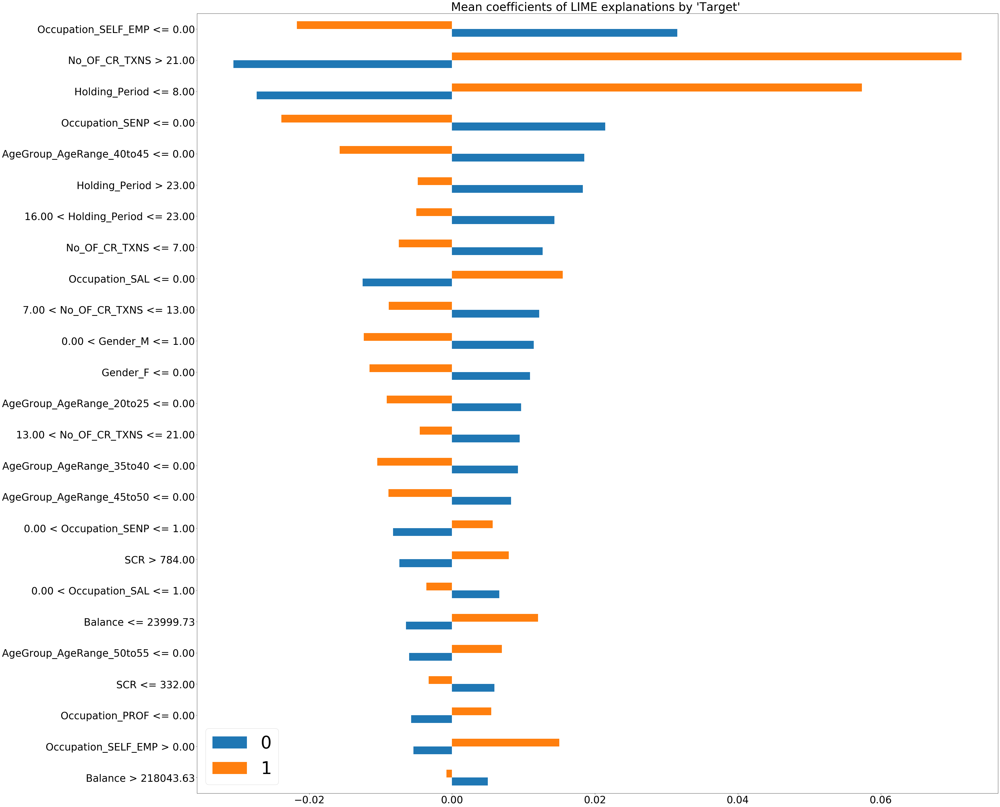

In [250]:
# Make it into a dataframe
W_pick=pd.DataFrame([dict(this.as_list(this.available_labels()[0])) for this in sp_obj.sp_explanations]).fillna(0)
 
W_pick['prediction'] = [this.available_labels()[0] for this in sp_obj.sp_explanations]
#Making a dataframe of all the explanations of sampled points
W=pd.DataFrame([dict(this.as_list(this.available_labels()[0])) for this in sp_obj.explanations]).fillna(0)
W['prediction'] = [this.available_labels()[0] for this in sp_obj.explanations]
 
#Plotting the aggregate importances
np.abs(W.drop("prediction", axis=1)).mean(axis=0).sort_values(ascending=False).head(25).sort_values(ascending=True).plot(color='g',fontsize=30,figsize=(50,30),kind="barh")
plt.title("Mean effect from LIME",fontsize=40)

#Aggregate importances split by classes
grped_coeff = W.groupby("prediction").mean()
 
grped_coeff = grped_coeff.T
grped_coeff["abs"] = np.abs(grped_coeff.iloc[:, 0])
grped_coeff.sort_values("abs", inplace=True, ascending=False)
grped_coeff.head(25).sort_values("abs", ascending=True).drop("abs", axis=1).plot(fontsize=35,figsize=(50,50),kind="barh") 
plt.title("Mean coefficients of LIME explanations by 'Target' ",fontsize=40)
plt.legend(fontsize=60)

Observation:

1. The first plot shows the mean effect of each variable from the LIME
2. The second plot shows Mean coefficients of LIME explanations by 'Target'

## SHapley Additive exPlanations (SHAP)

SHAP is a method to explain individual predictions.
The goal of SHAP is to explain the prediction of an instance x by computing the contribution of each feature
to the prediction. Shapley values tell us how to fairly distribute the prediction among the features. 

In [1]:
#!pip install shap==0.36.0

In [2]:
#!pip install shap

In [21]:
#conda install -c conda-forge shap

^C

Note: you may need to restart the kernel to use updated packages.


In [38]:
#conda update -n base -c defaults conda 
#---- THIS one is to be executed

Solving environment: ...working... done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [17]:
import shap
shap.initjs()

In [18]:
# j will be the record we explain
j = 0
# initialize js for SHAP
shap.initjs()

In [19]:
import sklearn.ensemble
from sklearn.ensemble import RandomForestClassifier

In [20]:
X=data_dummy.drop(["Target","Age"],axis=1)
y=data_dummy['Target']

In [21]:
# Import train and test data split class
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=400)

In [22]:
#Finalize  trees
clfRF=RandomForestClassifier(n_estimators=490,oob_score=True,n_jobs=-1,random_state=400)

In [23]:
# Fit final model
clfRF.fit(X_train,y_train)

RandomForestClassifier(n_estimators=490, n_jobs=-1, oob_score=True,
                       random_state=400)

SHAP Feature Importance:

The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important.
Since we want the global importancewe average the absolute Shapley values per feature across the data.

SHAP feature importance is an alternative to permutation feature importance. There is a big difference between both importance measures: Permutation feature importance is based on the decrease in model performance. SHAP is based on magnitude of feature attributions.

 99%|===================| 198/200 [01:00<00:00]        

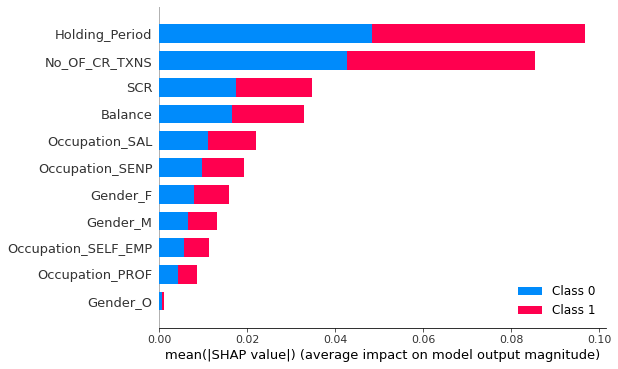

In [26]:
subset_to_explain = X_test.iloc[0:100]
explainer = shap.TreeExplainer(clfRF, subset_to_explain)
shap_values = explainer.shap_values(subset_to_explain)
shap.initjs()
shap.summary_plot(shap_values, subset_to_explain)

# for the first 100 values 

100%|===================| 11877/11878 [79:38<00:00]        

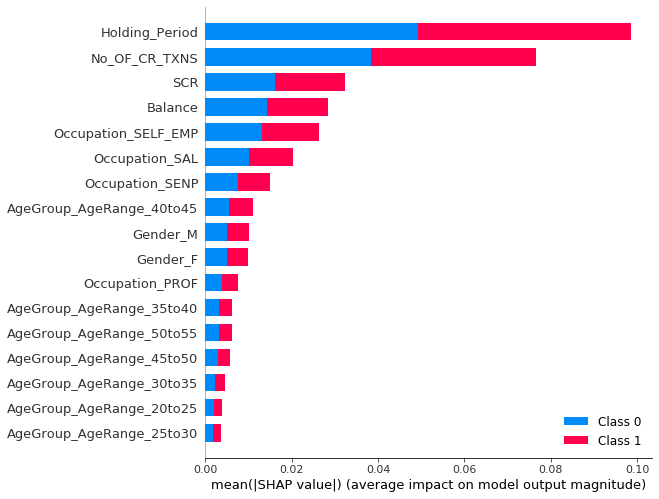

In [24]:
subset_to_explain = X_test.iloc[0:]
explainer = shap.TreeExplainer(clfRF, subset_to_explain)
shap_values = explainer.shap_values(subset_to_explain)
shap.initjs()
shap.summary_plot(shap_values, subset_to_explain)
#all values

Based on the SHAP summary plot, we can see top 11 features and their indications of the relationship 
between the value of a feature and the impact on the classification model. 
For better understanding let us have a look at the dependence plots.

SHAP Force Plot:
    
The plot consists of many force plots, each of which explains the prediction of an instance. 
We rotate the force plots vertically and place them side by side according to their clustering similarity.

Stacked SHAP explanations clustered by explanation similarity. 
Each position on the x-axis is an instance of the data. Red SHAP values increase the prediction, blue values decrease it. 
A cluster stands out: On the right is a group with a high predicted cancer risk.

In [25]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], subset_to_explain)

# for all values

shap.plots.force is slow for many thousands of rows, try subsampling your data.


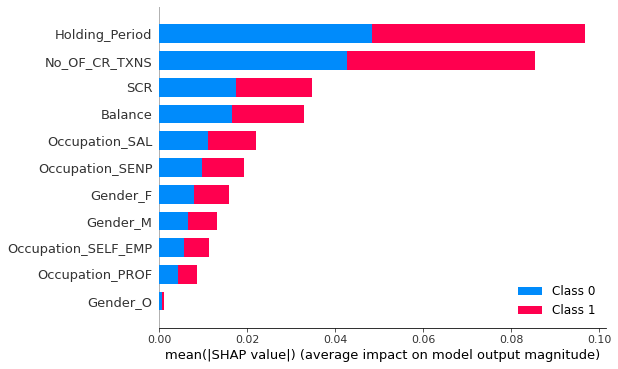

In [23]:
shap.summary_plot(shap_values, X_test)

In [34]:
def make_shap_waterfall_plot(shap_values, features, num_display=20):
    
    '''
    A function for building a SHAP waterfall plot.
    
    SHAP waterfall plot is used to visualize the most important features in a descending order.
    
    Parameters:
    shap_values (list): SHAP values obtained from a model
    features (pandas DataFrame): a list of features used in a model
    num_display(int): number of features to display
    
    Returns:
    matplotlib.pyplot plot: SHAP waterfall plot
    
    '''
    
    column_list = features.columns
    feature_ratio = (np.abs(shap_values).sum(0) / np.abs(shap_values).sum()) * 100
    column_list = column_list[np.argsort(feature_ratio)[::-1]]
    feature_ratio_order = np.sort(feature_ratio)[::-1]
    cum_sum = np.cumsum(feature_ratio_order)
    column_list = column_list[:num_display]
    feature_ratio_order = feature_ratio_order[:num_display]
    cum_sum = cum_sum[:num_display]
    
    num_height = 0
    if (num_display >= 20) & (len(column_list) >= 20):
        num_height = (len(column_list) - 20) * 0.4
        
    fig, ax1 = plt.subplots(figsize=(8, 8 + num_height))
    ax1.plot(cum_sum[::-1], column_list[::-1], c='blue', marker='o')
    ax2 = ax1.twiny()
    ax2.barh(column_list[::-1], feature_ratio_order[::-1], alpha=0.6)
    
    ax1.grid(True)
    ax2.grid(False)
    ax1.set_xticks(np.arange(0, round(cum_sum.max(), -1)+1, 10))
    ax2.set_xticks(np.arange(0, round(feature_ratio_order.max(), -1)+1, 10))
    ax1.set_xlabel('Cumulative Ratio')
    ax2.set_xlabel('Composition Ratio')
    ax1.tick_params(axis="y", labelsize=13)
    plt.ylim(-1, len(column_list))

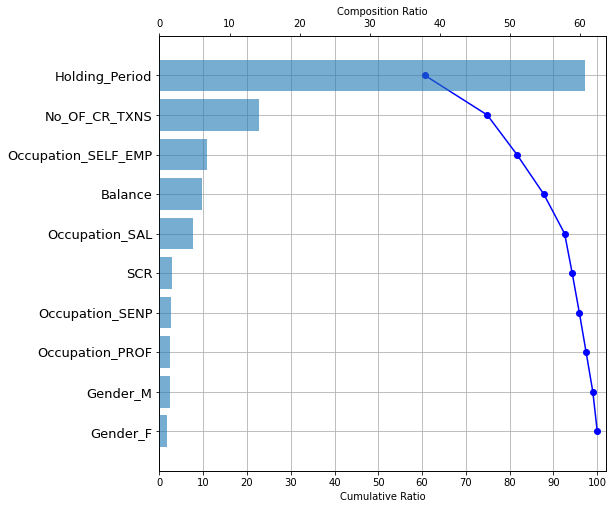

In [35]:
# Shapp waterfall plot
make_shap_waterfall_plot(shap_values[1], samples)

Based on the SHAP waterfall plot, we can say that Holding_Period is the most important feature in the model,
which has more than 60% of the model's explainability.
Also, these top 11 features provide 100% of the model's interpretation.

In [20]:
# Let's have a look on the top features and their dependence plots
top_features = ['Holding_Period', 'No_OF_CR_TXNS', 'Occupation_SELF_EMP', 'Balance']
feature_list = ['Occupation_SAL', 'SCR', 'Occupation_SENP']

100%|===================| 11873/11878 [45:52<00:01]        

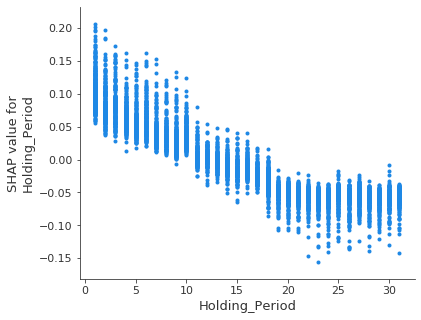

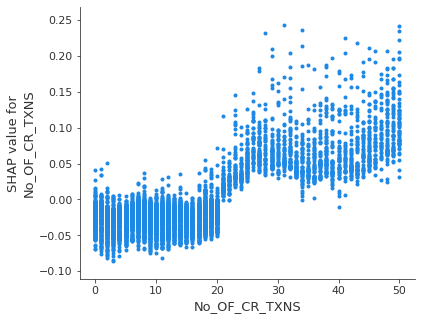

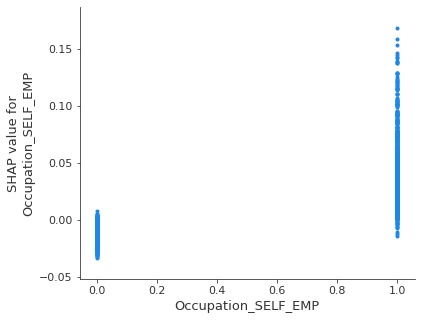

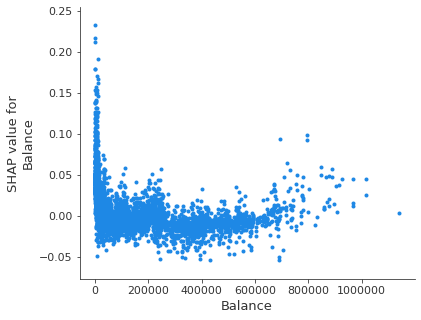

In [21]:
subset_to_explain = X_test.iloc[0:]
explainer = shap.TreeExplainer(clfRF, subset_to_explain)
shap_values = explainer.shap_values(subset_to_explain)
for feature in top_features:
    shap.dependence_plot(feature, shap_values[1], subset_to_explain, interaction_index=None)

Based on the SHAP depenndence plots, it is clear that customers, who are interested to take loan tend to have the following features:

1. Holding_Period<=10
2. No_OF_CR_TXNS >20
3. Occupation_SELF_EMP=1
4. Balance between 0 to 50000 

On the other hand, customers, who are not interested to take loanmay have the following features:

1. Holding_Period>10
2. No_OF_CR_TXNS <20
3. Occupation_SELF_EMP=0
4. Balance between > 50000 

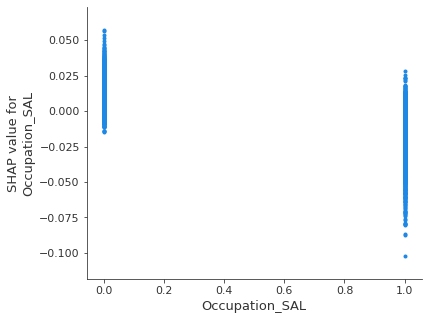

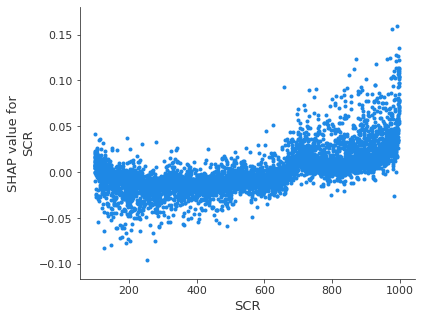

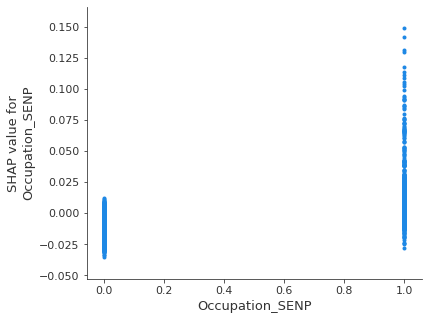

In [22]:
for feature in feature_list:
    shap.dependence_plot(feature, shap_values[1], subset_to_explain, interaction_index=None)

Based on the SHAP depenndence plots, it is clear that customers, who are interested to take loan tend to have the following features:

1. Occupation_SAL=0 
2. SCR>600
3. Occupation_SENP=1 

On the other hand, customers, who are not interested to take loanmay have the following features:

1. Occupation_SAL=1
2. SCR<600
3. Occupation_SENP=0 

However, as per logistic classification, Occupation_SENP does not impact the model
So, majorly, six variable are impacting the model and are the most important features. They are as follows:
  
1. Holding_Period
2. No_OF_CR_TXNS
3. Occupation_SELF_EMP
4. Balance
5. Occupation_SAL
6. SCR

## Permutation Feature Importance

In [27]:
!pip install eli5

You should consider upgrading via the 'C:\Users\hp\anaconda3\python.exe -m pip install --upgrade pip' command.


In [60]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(clf, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = data_dummy.drop(["Target","Age"], axis = 1).columns.tolist())

Weight,Feature
0.0129 ± 0.0047,No_OF_CR_TXNS
0.0047 ± 0.0015,Holding_Period
0.0045 ± 0.0008,Balance
0.0039 ± 0.0033,SCR
0.0031 ± 0.0015,Occupation_SELF_EMP
0.0012 ± 0.0005,Occupation_SENP
0.0006 ± 0.0007,AgeGroup_AgeRange_50to55
0.0006 ± 0.0003,AgeGroup_AgeRange_40to45
0.0006 ± 0.0011,Occupation_PROF
0.0005 ± 0.0004,AgeGroup_AgeRange_25to30


Interpretation:
    
The values towards the top are the most important features, and those towards the bottom matter least.

The first number in each row shows how much model performance decreased with a random shuffling 
(in this case, using "accuracy" as the performance metric).

Like most things in data science, there is some randomness to the exact performance change from a shuffling a column. We measure the amount of randomness in our permutation importance calculation by repeating the process with multiple shuffles. The number after the ± measures how performance varied from one-reshuffling to the next.

You'll occasionally see negative values for permutation importances. In those cases, the predictions on the shuffled (or noisy) data happened to be more accurate than the real data. This happens when the feature didn't matter (should have had an importance close to 0), but random chance caused the predictions on shuffled data to be more accurate. This is more common with small datasets

Interpretation with respect to the output:

1. The most important features are as follows:

a) No_OF_CR_TXNS

b) Holding_Period

c) Balance

d) SCR 

e) Occupation_SELF_EMP

2. There are two features with negative values for permutation importances. They are:

a) AgeGroup_AgeRange_45to50

b) Gender_F

These negative features show that the predictions on the shuffled (or noisy) data happened to be more accurate than the real data. It happens when the feature didn't matter (should have had an importance close to 0), but random chance caused the predictions on shuffled data to be more accurate.

## KNN

In [19]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,random_state=1, stratify=y)

In [20]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)

X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

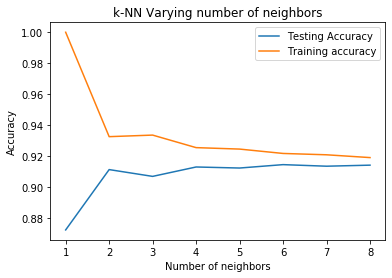

In [173]:
from sklearn.neighbors import KNeighborsClassifier

#Setup arrays to store training and test accuracies
neighbors = np.arange(1,9)
train_accuracy =np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

for i,k in enumerate(neighbors):
    #Setup a knn classifier with k neighbors
    knn = KNeighborsClassifier(n_neighbors=k)
    
    #Fit the model
    knn.fit(X_train, y_train)
    #Compute accuracy on the training set
    train_accuracy[i] = knn.score(X_train, y_train)
    
    #Compute accuracy on the test set
    test_accuracy[i] = knn.score(X_test, y_test) 
    
#Generate plot
plt.title('k-NN Varying number of neighbors')
plt.plot(neighbors, test_accuracy, label='Testing Accuracy')
plt.plot(neighbors, train_accuracy, label='Training accuracy')
plt.legend()
plt.xlabel('Number of neighbors')
plt.ylabel('Accuracy')
plt.show()

In [174]:
#import GridSearchCV
from sklearn.model_selection import GridSearchCV


In [175]:
from sklearn.neighbors import KNeighborsClassifier

In [178]:
param_grid = {'n_neighbors':np.arange(1,25)}
knn = KNeighborsClassifier()
knn_cv= GridSearchCV(knn,param_grid,cv=5)
knn_cv.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])})

In [179]:
knn_cv.best_score_

0.9153498692654232

In [180]:
knn_cv.best_params_

{'n_neighbors': 11}

In [21]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=12)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=12)

In [22]:
knn.score(X_test, y_test)

0.9154739855194477

In [23]:
y_pred = knn.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [184]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[5409   17]
 [ 485   28]]
              precision    recall  f1-score   support

           0       0.92      1.00      0.96      5426
           1       0.62      0.05      0.10       513

    accuracy                           0.92      5939
   macro avg       0.77      0.53      0.53      5939
weighted avg       0.89      0.92      0.88      5939



In [185]:
confusion_matrix(y_test,y_pred)

array([[5409,   17],
       [ 485,   28]], dtype=int64)

In [186]:
pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=True)

Predicted,0,1,All
Actual,,,
0,5409,17,5426
1,485,28,513
All,5894,45,5939


Format of Confusion Matrix:

               Predicted
               0     1
   
   Actual
   
              0 TP   FP

              1 FN   TN

1. Accuracy:
    
    Here. Accuracy=92%
    It means that with 92% predictions are right
    
2. Precision: 
    Precision=62%
    
    It means that when the model predicts a customer is not interested, it is correct 62% of the time. 
    62% of positive identifications was actually correct
    
3. Recall: 
    Recall=5%
    
    It means that when the model correctly predicts 5% of all non-interested customers. 
    5% of actual positives was identified correctly
    

auc_knn=  0.7169848229124228


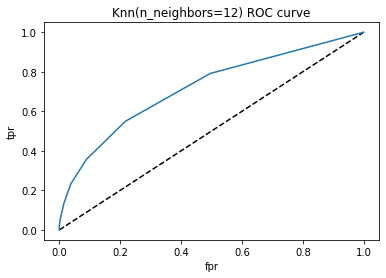

In [188]:
y_pred_proba = knn.predict_proba(X_test)[:,1]
auc_knn=metrics.roc_auc_score(y_test,y_pred_proba)  # probs[:,1] >> first columns of not taken loan and taken loan array of probabilities
print("auc_knn= ",auc_knn)
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='Knn')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('Knn(n_neighbors=12) ROC curve')
plt.show()

In [190]:
error = []

# Calculating error for K values between 1 and 40
for i in range(1, 25):
    knn_err = KNeighborsClassifier(n_neighbors=i)
    knn_err.fit(X_train, y_train)
    pred_i = knn_err.predict(X_test)
    error.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Mean Error')

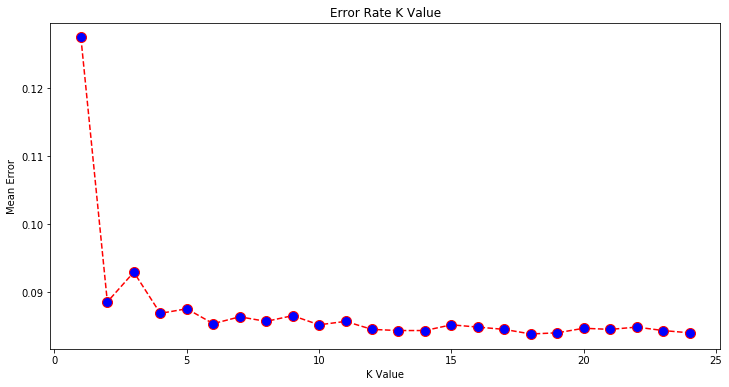

In [191]:
plt.figure(figsize=(12, 6))
plt.plot(range(1, 25), error, color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate K Value')
plt.xlabel('K Value')
plt.ylabel('Mean Error')

In [196]:
from sklearn.model_selection import cross_val_score
import numpy as np
#create a new KNN model
knn_cv = KNeighborsClassifier(n_neighbors=12)
#train model with cv of 5 
cv_scores = cross_val_score(knn_cv, X, y, cv=5)
#print each cv score (accuracy) and average them
print(cv_scores)
print("cv_scores mean:",np.mean(cv_scores))

[0.91313131 0.91310937 0.91184643 0.91285678 0.91437232]
cv_scores mean: 0.9130632416613725


Using cross-validation, our mean score is about 91.3%.   # This is a more accurate representation of how our model will perform on unseen data than our earlier testing using the holdout method.

In [197]:
#import GridSearchCV
from sklearn.model_selection import GridSearchCV

In [204]:
param_grid = {'n_neighbors':np.arange(1,25)}
knn = KNeighborsClassifier()
knn_cv= GridSearchCV(knn,param_grid,cv=5)
knn_cv.fit(X,y)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])})

In [205]:
knn_cv.best_score_

0.9137704654527085

In [206]:
knn_cv.best_params_

{'n_neighbors': 20}

The best value of n_neighbour is 20 with 91.38%.

## Support Vector Machine (SVM) 

In [17]:
X=data_dummy.drop(["Target","Age"],axis=1)
y=data_dummy['Target']

In [18]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3) 

In [19]:
from sklearn import svm
from sklearn.svm import SVC

#Create a svm Classifier
cls = SVC(kernel='linear') # Linear Kernel

In [ ]:
#Train the model using the training sets
cls.fit(X_train, y_train)

In [19]:
#Predict the response for test dataset
y_pred = cls.predict(X_test)

In [22]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[5223  176]
 [ 473   67]]
              precision    recall  f1-score   support

           0       0.92      0.97      0.94      5399
           1       0.28      0.12      0.17       540

    accuracy                           0.89      5939
   macro avg       0.60      0.55      0.56      5939
weighted avg       0.86      0.89      0.87      5939



Format of Confusion Matrix:

               Predicted
               0     1
   
   Actual
   
              0 TP   FP

              1 FN   TN

1. Accuracy:
    
    Here. Accuracy=89%
    It means that with 89% predictions are right
    
2. Precision: 
    Precision=28%
    
    It means that when the model predicts a customer is not interested, it is correct 28% of the time. 
    28% of positive identifications was actually correct
    
3. Recall: 
    Recall=12%
    
    It means that when the model correctly predicts 12% of all non-interested customers. 
    12% of actual positives was identified correctly
    
    

auc_svm=  0.6058241238089358


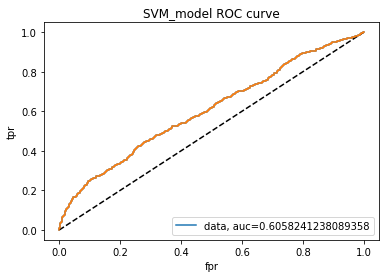

In [25]:
import sklearn.metrics
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

y_score=cls.decision_function(X_test)
auc_svm=roc_auc_score(y_test,y_score)
print("auc_svm= ",auc_svm)

fpr, tpr, thresholds = roc_curve(y_test, y_score)

plt.plot(fpr,tpr,"-",label="data, auc="+str(auc_svm)) 
plt.legend(loc=4)

plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='SVM_model')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('SVM_model ROC curve')
plt.show()

## Catboost

In [49]:
X=data_dummy.drop(["Target","Age"],axis=1)
y=data_dummy['Target']

In [50]:
#!pip install catboost

In [51]:
import catboost
print('catboost version:', catboost.__version__)
from catboost import CatBoostClassifier

catboost version: 0.24.2


In [52]:
features= [feat for feat in list(X)]
print (features) 
categorical_feat = np.where(X[features].dtypes)

['Balance', 'No_OF_CR_TXNS', 'SCR', 'Holding_Period', 'Gender_F', 'Gender_M', 'Occupation_PROF', 'Occupation_SAL', 'Occupation_SELF_EMP', 'Occupation_SENP', 'AgeGroup_AgeRange_20to25', 'AgeGroup_AgeRange_25to30', 'AgeGroup_AgeRange_30to35', 'AgeGroup_AgeRange_35to40', 'AgeGroup_AgeRange_40to45', 'AgeGroup_AgeRange_45to50', 'AgeGroup_AgeRange_50to55']


In [53]:
from sklearn.model_selection import train_test_split 
X_train,X_test,y_train,y_test=train_test_split(X[features],y,test_size= 0.30,random_state=1)
params = {'iterations':5000,
        'learning_rate':0.01,
     
        'depth':3,
        'eval_metric':'AUC',
        'verbose':200,
        'od_type':"Iter", # overfit detector
        'od_wait':500, # most recent best iteration to wait before stopping
        'random_seed': 1
          }

cat_model = CatBoostClassifier(**params)
cat_model.fit(X_train, y_train,   
          eval_set=(X_test, y_test), 
          use_best_model=True, # True if we don't want to save trees created after iteration with the best validation score
          plot=True  
         );

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6261897	best: 0.6261897 (0)	total: 7.76ms	remaining: 38.8s
200:	test: 0.7743021	best: 0.7743755 (198)	total: 1.67s	remaining: 40s
400:	test: 0.7789985	best: 0.7789985 (400)	total: 3.41s	remaining: 39.1s
600:	test: 0.7817403	best: 0.7817403 (600)	total: 4.92s	remaining: 36.1s
800:	test: 0.7838541	best: 0.7838541 (800)	total: 6.49s	remaining: 34s
1000:	test: 0.7857081	best: 0.7857081 (1000)	total: 8.09s	remaining: 32.3s
1200:	test: 0.7865773	best: 0.7866588 (1167)	total: 9.71s	remaining: 30.7s
1400:	test: 0.7866176	best: 0.7866969 (1243)	total: 11.4s	remaining: 29.2s
1600:	test: 0.7870555	best: 0.7870680 (1597)	total: 13s	remaining: 27.6s
1800:	test: 0.7870757	best: 0.7873128 (1721)	total: 14.7s	remaining: 26.1s
2000:	test: 0.7867780	best: 0.7873128 (1721)	total: 16.3s	remaining: 24.5s
2200:	test: 0.7868280	best: 0.7873128 (1721)	total: 18s	remaining: 22.9s
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.787312833
bestIteration = 1721

Shrink model to firs

In [54]:
y_pred = cat_model.predict(X_test)
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
print('Accuracy Score:', cat_model.score(X_test,y_test))

[[5418   20]
 [ 460   41]]
              precision    recall  f1-score   support

           0       0.92      1.00      0.96      5438
           1       0.67      0.08      0.15       501

    accuracy                           0.92      5939
   macro avg       0.80      0.54      0.55      5939
weighted avg       0.90      0.92      0.89      5939

Accuracy Score: 0.9191783128472807


Format of Confusion Matrix:

               Predicted
               0     1
   
   Actual
   
              0 TP   FP

              1 FN   TN

1. Accuracy:
    
    Here. Accuracy=92%
    It means that with 92% predictions are right
    
2. Precision: 
    Precision=67%
    
    It means that when the model predicts a customer is not interested, it is correct 67% of the time. 
    67% of positive identifications was actually correct
    
3. Recall: 
    Recall=8%
    
    It means that when the model correctly predicts 8% of all non-interested customers. 
    8% of actual positives was identified correctly
    

auc_cat=  0.7873128329585771


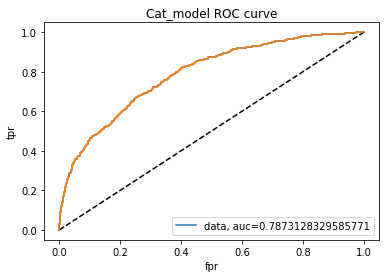

In [55]:
import sklearn.metrics
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

y_pred_proba =  cat_model.predict_proba(X_test)[:,1]
auc_cat=roc_auc_score(y_test,y_pred_proba)  # probs[:,1] >> first columns of not taken loan and taken loan array of probabilities
print("auc_cat= ",auc_cat)

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.plot(fpr,tpr,"-",label="data, auc="+str(auc_cat)) 
plt.legend(loc=4)

plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='Cat_model')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('Cat_model ROC curve')
plt.show()

Holding_Period              41.197546
No_OF_CR_TXNS               19.623862
Balance                     12.192764
SCR                          7.932912
Occupation_SELF_EMP          5.533024
Occupation_SENP              3.111254
Occupation_SAL               2.383895
Gender_M                     1.965441
Gender_F                     1.867910
AgeGroup_AgeRange_40to45     1.172369
AgeGroup_AgeRange_50to55     1.167522
AgeGroup_AgeRange_20to25     0.648510
AgeGroup_AgeRange_35to40     0.500409
Occupation_PROF              0.412433
AgeGroup_AgeRange_25to30     0.171951
AgeGroup_AgeRange_30to35     0.079057
AgeGroup_AgeRange_45to50     0.039141
dtype: float64


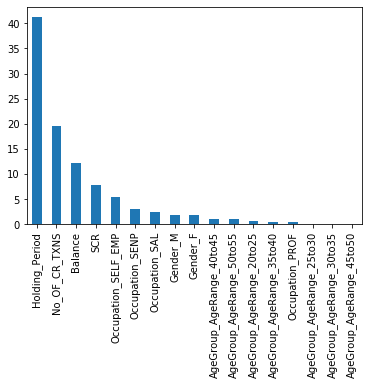

In [56]:
# Getting feature names
feature_names = data_dummy.drop(["Target","Age"], axis = 1).columns
# Appending feature names
imp_feat=pd.Series(cat_model.feature_importances_,index=feature_names.tolist())
# Sorting by feature importances
print(imp_feat.sort_values(ascending=False))
# Plotting bar chart of fetaures importances
imp_feat.sort_values(ascending=False).plot(kind='bar')

Now, as per the feature importance of CatBoost, the sequence of these independent variables as per their importances are:

a) Holding_Period

b) No_OF_CR_TXNS

c) Balance

d) SCR 

e) Occupation_SELF_EMP

### Conclusion with respect to models

Random Forest has been finalised because of following reasons:

1. Model is good with accuracy 91.98% (~92%) and precision 67%
2. AUC is 77.55% (~78%)
3. FP=31 which is less. It states that the actual value=0, but predicted value=1. This should be less. Cause if it would have been in larger proportion, then the cost of approaching those customers would have got wasted
4. The feature importance is also in line with logistic regression

Therefore, LIME and SHAP have been performed on the random forest model.

Logistic regression has been used to identify different segments (profitable segment).

Based on the all the models,SHAP, LIME and Permutation Feature Importance,  it can be concluded that the most important variables are as follows:

a) No_OF_CR_TXNS

b) Holding_Period

c) Balance

d) SCR 

e) Occupation_SELF_EMP

